# Data Processing Workbook

___
## Import Section
- [Pre-Processing](#Pre-Processing)
- [EDA](#EDA)
- [Data Preparation](#Data-preparation)
- [Training](#Training)
- [Evaluation](#Evaluation)

In [2]:
import os

import pandas as pd
import src.preprocess as pp
import src.data_preparation as dp
import src.model as mdl
import src.visualizations as vis
import fiftyone as fo
import tools.fiftyone as fo_tools

from pathlib import Path

___
## Pre-Processing
[Imports](#Import-Section)

In [3]:
## Define data path and load data
data_path = Path('/home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/visdrone_src')
# load Model
model = mdl.load_model()

In [ ]:
## This code block is only necessary to convert visdrone from its source format to a yolo format
pp.visdrone2yolo(data_path)

Converting VisDrone2019-DET-train: 6471it [00:44, 144.38it/s]
Converting VisDrone2019-DET-val: 548it [00:04, 112.98it/s]
Converting VisDrone2019-DET-test-dev: 1610it [00:09, 175.39it/s]


In [ ]:
## Cut Video into key_frames
pp.extract_key_frames(data_path)

In [4]:
# Creates a dataframe from the images and the yolo format label files if they exist
data_df = pp.create_df_from_yolo(data_path)
data_df.head()

,img_id,img_ht,img_wd,channels,img_type,test_train_val_split,cls,x_center,y_center,width,height,bbox_sz_W,bbox_sz_H
1,0000105_02747_d_0000073,765,1360,3,.jpg,VisDrone2019-DET-test-dev,8,0.099632,0.042484,0.052206,0.084967,71.0,65.0
2,0000105_02747_d_0000073,765,1360,3,.jpg,VisDrone2019-DET-test-dev,3,0.134191,0.088235,0.024265,0.035294,33.0,27.0
3,0000105_02747_d_0000073,765,1360,3,.jpg,VisDrone2019-DET-test-dev,1,0.13125,0.069281,0.003676,0.023529,5.0,18.0
4,0000105_02747_d_0000073,765,1360,3,.jpg,VisDrone2019-DET-test-dev,1,0.127574,0.062745,0.003676,0.023529,5.0,18.0
5,0000105_02747_d_0000073,765,1360,3,.jpg,VisDrone2019-DET-test-dev,0,0.178309,0.162745,0.009559,0.035294,13.0,27.0


In [3]:
# Load data from CSV file
data_df = pd.read_csv('dataset.csv')

___
## EDA
[Imports](#Import-Section)

In [5]:
# Check for duplicates
print(f'duplicates: {data_df.duplicated().sum()} / {len(data_df)}')
data_df = data_df.drop_duplicates()
print(f'duplicates: {data_df.duplicated().sum()} / {len(data_df)}')


duplicates: 4 / 457066
duplicates: 0 / 457062


In [6]:
# Look at data prior to dtype modification
data_df.describe()

,img_id,img_ht,img_wd,channels,img_type,test_train_val_split,cls,x_center,y_center,width,height,bbox_sz_W,bbox_sz_H
count,457062,457062,457062,457062,457062,457062,457062,457062.0000,457062.0,457062.000,457062.000000,457062.0,457062.0
unique,8629,11,10,1,1,3,10,18118.0000,13454.0,2082.000,2064.000000,516.0,454.0
top,0000059_01886_d_0000114,1050,1400,3,.jpg,VisDrone2019-DET-train,3,0.4875,0.4,0.005,0.013333,8.0,17.0
freq,902,134187,226603,457062,457062,343201,187004,308.0000,291.0,7361.000,4501.000000,13654.0,12718.0


In [7]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 457062 entries, 1 to 457066
Data columns (total 13 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   img_id                457062 non-null  object
 1   img_ht                457062 non-null  object
 2   img_wd                457062 non-null  object
 3   channels              457062 non-null  object
 4   img_type              457062 non-null  object
 5   test_train_val_split  457062 non-null  object
 6   cls                   457062 non-null  object
 7   x_center              457062 non-null  object
 8   y_center              457062 non-null  object
 9   width                 457062 non-null  object
 10  height                457062 non-null  object
 11  bbox_sz_W             457062 non-null  object
 12  bbox_sz_H             457062 non-null  object
dtypes: object(13)
memory usage: 48.8+ MB


In [8]:
data_df = data_df.astype({
    'img_ht': 'int32', 
    'img_wd': 'int32', 
    'channels': 'int32',
    'cls': 'int32', 
    'x_center': 'float32', 
    'y_center': 'float32', 
    'width': 'float32', 
    'height': 'float32', 
    'bbox_sz_W': 'float32',
    'bbox_sz_H': 'float32'})
data_df.describe()

,img_ht,img_wd,channels,cls,x_center,y_center,width,height,bbox_sz_W,bbox_sz_H
count,457062.000000,457062.000000,457062.0,457062.000000,457062.000000,457062.000000,457062.000000,457062.000000,457062.000000,457062.000000
mean,963.816793,1502.206342,3.0,2.938831,0.493721,0.410664,0.024408,0.038120,36.651119,36.064774
std,243.371281,276.999049,0.0,2.585393,0.229579,0.248080,0.025293,0.032812,38.966946,32.726608
min,360.000000,480.000000,3.0,0.000000,0.001429,0.001429,0.001000,0.000000,2.000000,0.000000
25%,765.000000,1360.000000,3.0,1.000000,0.338205,0.211000,0.008571,0.017333,12.000000,16.000000
50%,1050.000000,1400.000000,3.0,3.000000,0.492750,0.382614,0.016180,0.028571,24.000000,26.000000
75%,1050.000000,1400.000000,3.0,3.000000,0.647500,0.586190,0.030793,0.047310,46.000000,44.000000
max,1500.000000,2000.000000,3.0,9.000000,0.998214,0.996827,0.610294,0.805229,983.000000,790.000000


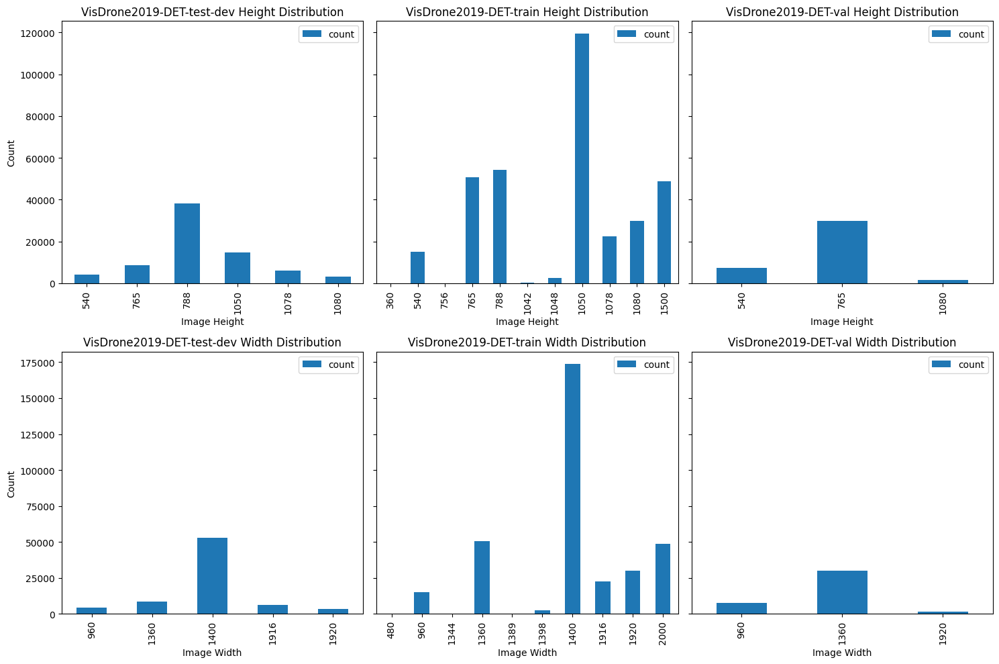

Plot saved to plots/image_sz_distribution_by_split.png


In [9]:
# Create visualizations of the image height and width between the to datasets
vis.plot_image_sz_distribution(data_df)


In [10]:
# Create visualizations of each class representation in the dataset
vis.plot_cls_representations(data_path, data_df)

Plot saved to images/0000103_01734_d_0000028_class_0.jpg
Plot saved to images/9999937_00000_d_0000105_class_1.jpg
Plot saved to images/0000103_02964_d_0000030_class_2.jpg
Plot saved to images/0000103_01734_d_0000028_class_3.jpg
Plot saved to images/0000103_02964_d_0000030_class_4.jpg
Plot saved to images/0000103_03349_d_0000031_class_5.jpg
Plot saved to images/9999937_00000_d_0000004_class_6.jpg
Plot saved to images/0000360_07253_d_0000750_class_7.jpg
Plot saved to images/9999966_00000_d_0000034_class_8.jpg
Plot saved to images/0000103_02544_d_0000029_class_9.jpg


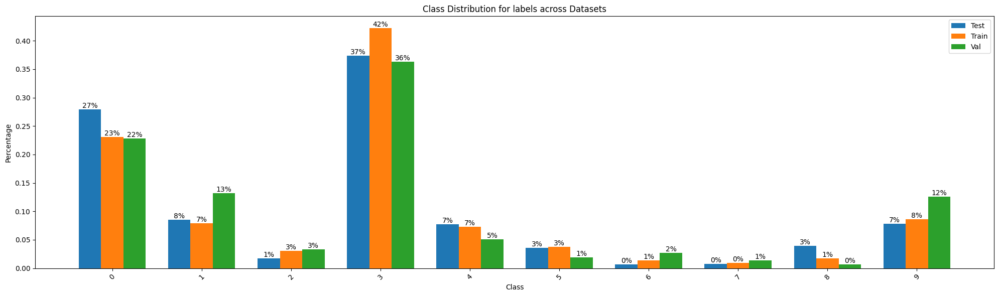

Plot saved to plots/class_distribution_by_set.png


In [11]:
# plot density of classes in each split of the dataset
vis.plot_class_distribution_by_set(data_df)

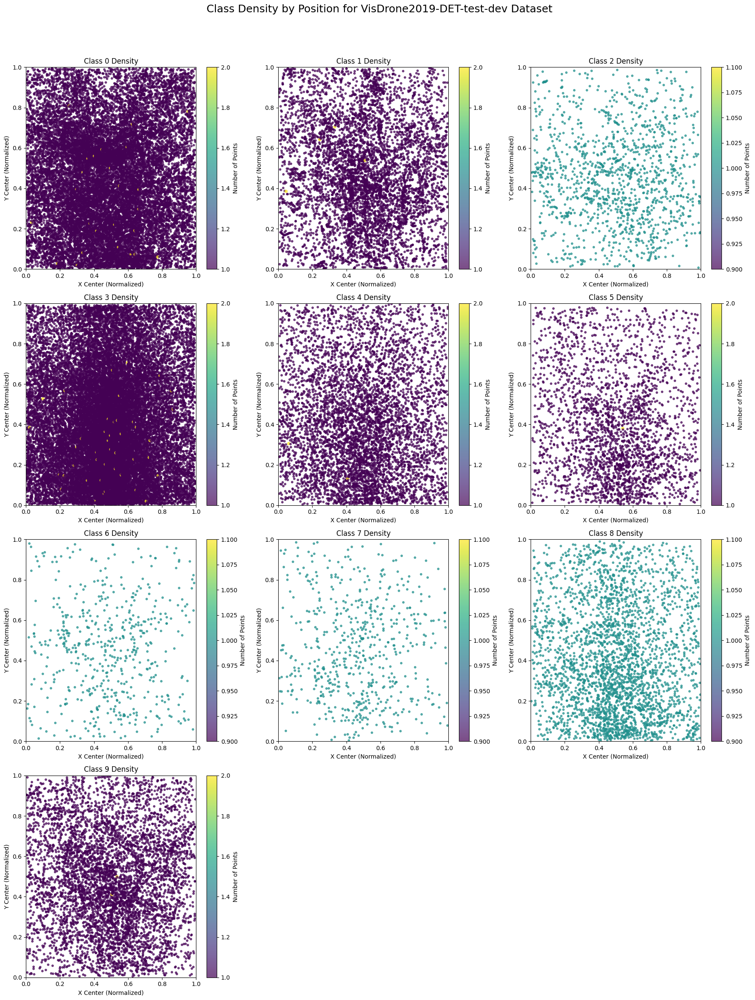

Multi-plot saved for VisDrone2019-DET-test-dev to plots/class_density_by_position_VisDrone2019-DET-test-dev.png


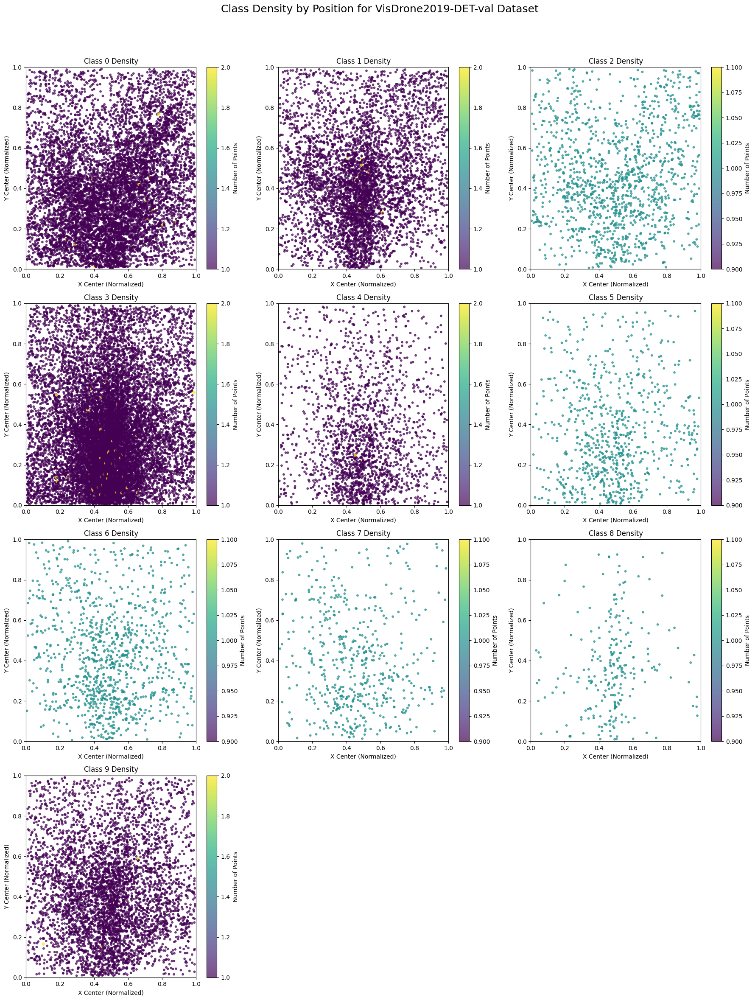

Multi-plot saved for VisDrone2019-DET-val to plots/class_density_by_position_VisDrone2019-DET-val.png


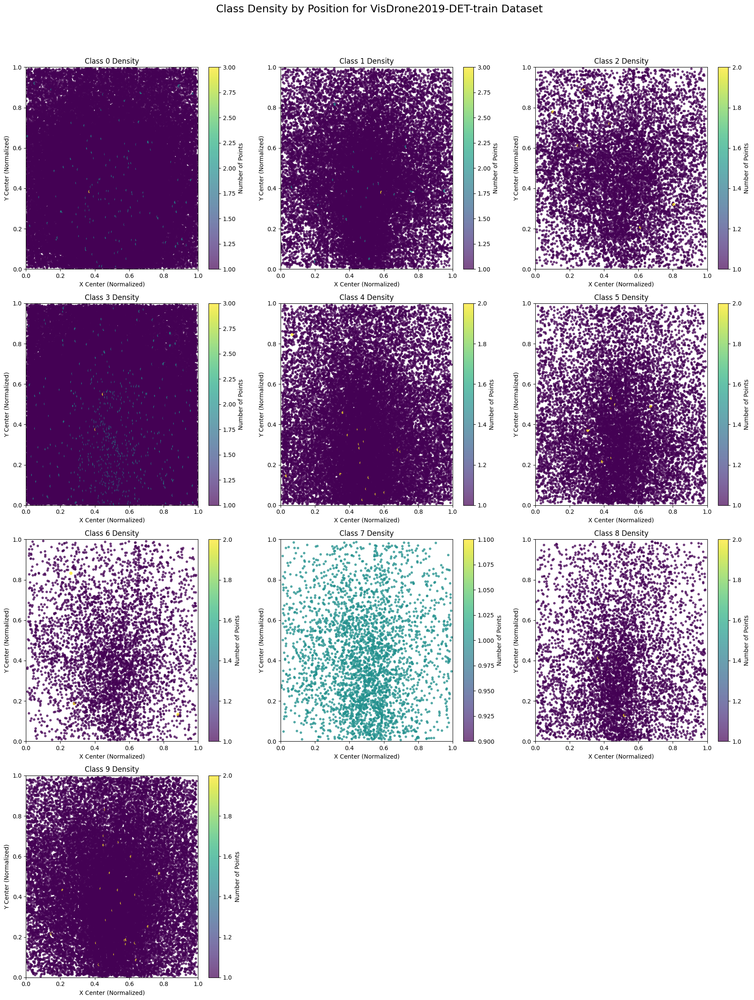

Multi-plot saved for VisDrone2019-DET-train to plots/class_density_by_position_VisDrone2019-DET-train.png


In [8]:
# Visualize the distribution of classes x and y location in the image between dataset splits
vis.plot_class_density_by_split(data_df)

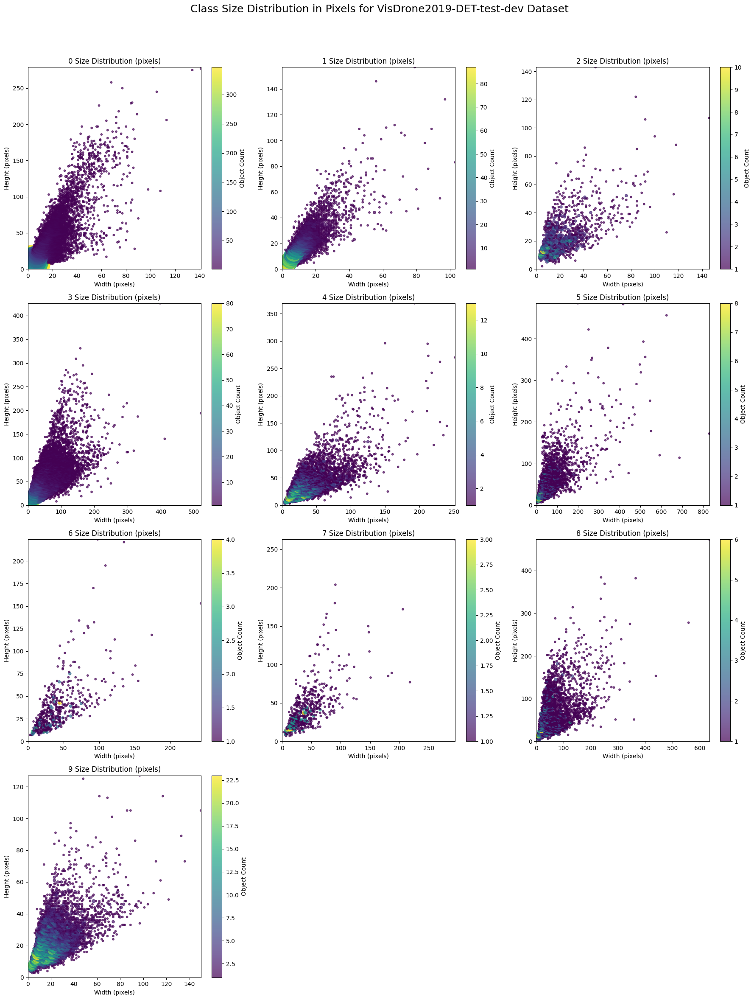

Pixel size distribution plot saved for VisDrone2019-DET-test-dev to plots/class_pixel_size_distribution_VisDrone2019-DET-test-dev.png


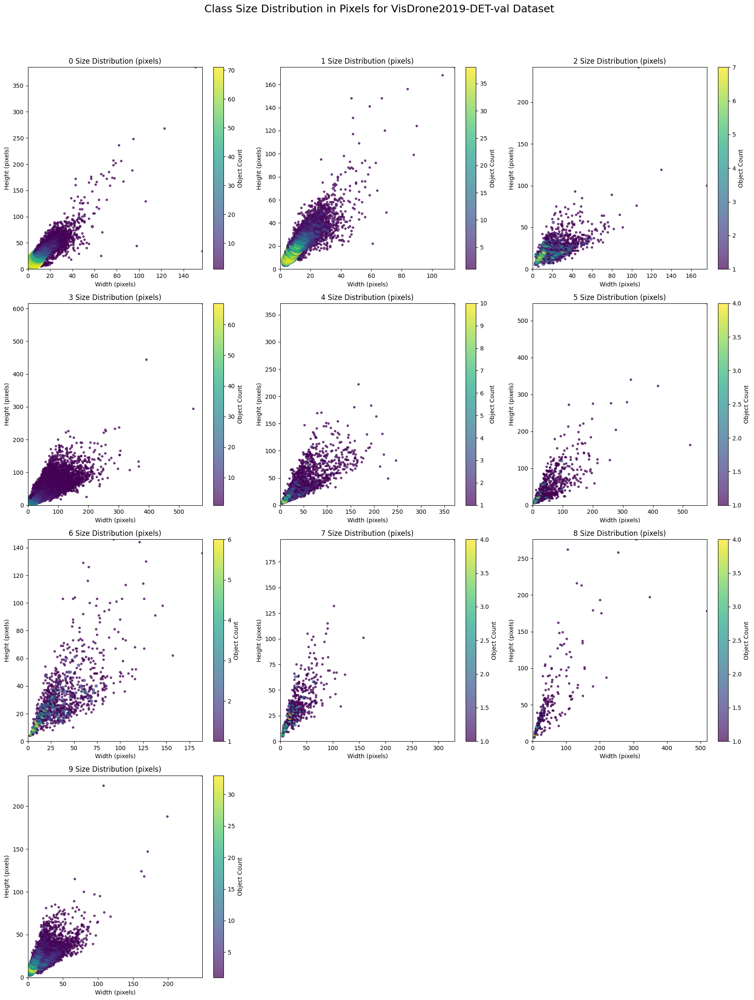

Pixel size distribution plot saved for VisDrone2019-DET-val to plots/class_pixel_size_distribution_VisDrone2019-DET-val.png


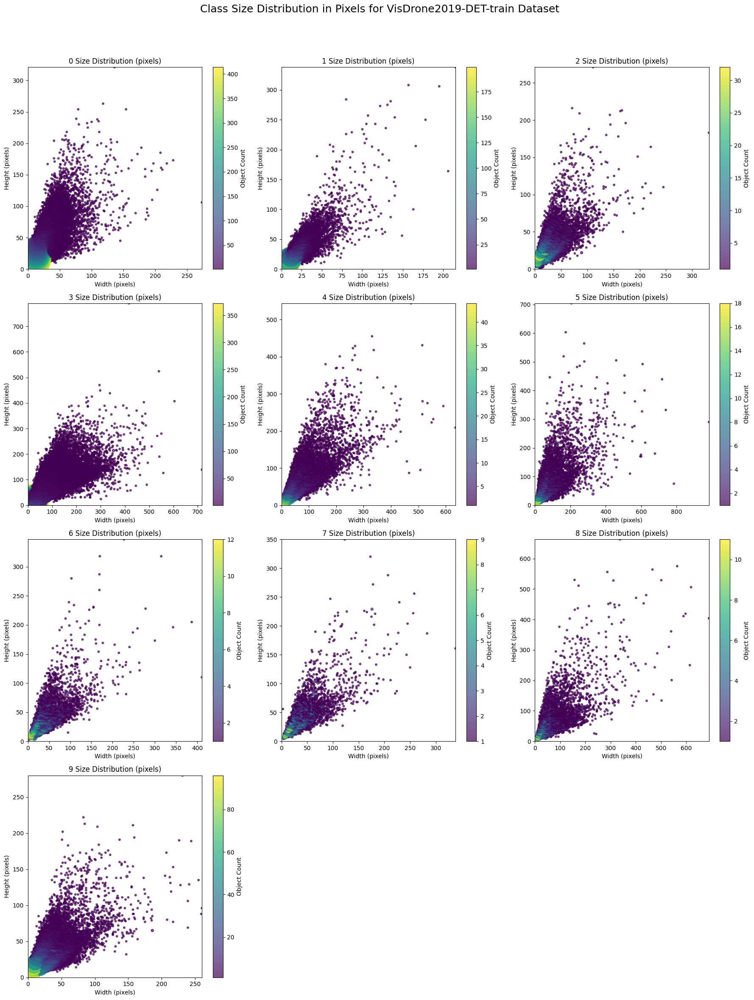

Pixel size distribution plot saved for VisDrone2019-DET-train to plots/class_pixel_size_distribution_VisDrone2019-DET-train.png


In [9]:
# Visualize the distribution of classes height and width between dataset splits
vis.plot_class_density_by_split_size(data_df)

In [12]:
## For Testing only -  used to upload data to fiftyone and delete datasets/brain_runs
for dataset in fo.list_datasets():
    fo.delete_dataset(dataset)

In [29]:
# Using fiftyone and the dataset.yaml, upload specific splits for the dataset

splits = ['val', 'test']
name = 'Visdrone_exp'

dataset = fo.Dataset(name=name)

for data_split in splits:
    dataset.add_dir(
        dataset_path_test,
        dataset_type=fo.types.YOLOv5Dataset,
        split=data_split,
        tags=data_split,
)

 100% |█████████████████| 548/548 [7.7s elapsed, 0s remaining, 77.9 samples/s]       
 100% |███████████████| 1610/1610 [14.7s elapsed, 0s remaining, 115.5 samples/s]      


In [13]:
# Load the dataset into fiftyone from a processed dataset
dataset = fo.Dataset.from_dir(
    './processed_Visdrone_exp_dataset',
    dataset_type=fo.types.FiftyOneDataset,
    )

Importing samples...
 100% |███████████████| 2158/2158 [222.4ms elapsed, 0s remaining, 9.7K samples/s]     


In [30]:
# Compute similarity and uniqueness along with metadata for the dataset
fo_tools.compute_similarity_uniqueness(dataset)


Computing metadata...


 100% |███████████████| 2158/2158 [1.1s elapsed, 0s remaining, 2.0K samples/s]         
Computing embeddings...
 100% |███████████████| 2158/2158 [9.2s elapsed, 0s remaining, 563.2 samples/s]      
Computing uniqueness...
Uniqueness computation complete
Computing embeddings...
 100% |███████████████| 2158/2158 [38.8s elapsed, 0s remaining, 47.1 samples/s]      
Computing embeddings...
 100% |███████████████| 2158/2158 [41.7s elapsed, 0s remaining, 41.6 samples/s]      
Generating visualization...
UMAP( verbose=True)
Sun Dec 15 06:51:58 2024 Construct fuzzy simplicial set
Sun Dec 15 06:52:00 2024 Finding Nearest Neighbors
Sun Dec 15 06:52:01 2024 Finished Nearest Neighbor Search
Sun Dec 15 06:52:02 2024 Construct embedding


Epochs completed:   7%| ▋          34/500 [00:01]

	completed  0  /  500 epochs
	completed  50  /  500 epochs


Epochs completed:  33%| ███▎       166/500 [00:01]

	completed  100  /  500 epochs
	completed  150  /  500 epochs


Epochs completed:  46%| ████▌      231/500 [00:01]

	completed  200  /  500 epochs


Epochs completed:  61%| ██████▏    307/500 [00:02]

	completed  250  /  500 epochs
	completed  300  /  500 epochs


Epochs completed:  74%| ███████▍   372/500 [00:02]

	completed  350  /  500 epochs


Epochs completed:  86%| ████████▌  429/500 [00:02]

	completed  400  /  500 epochs
	completed  450  /  500 epochs


Epochs completed: 100%| ██████████ 500/500 [00:02]


Sun Dec 15 06:52:05 2024 Finished embedding
Computing embeddings...
 100% |███████████████| 2158/2158 [1.4m elapsed, 0s remaining, 30.5 samples/s]      
Generating visualization...


/home/allen4/work_proj/VISDRONE_DATASET_EVAL/.visdrone_env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2158 samples in 0.001s...
[t-SNE] Computed neighbors for 2158 samples in 0.398s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2158
[t-SNE] Computed conditional probabilities for sample 2000 / 2158
[t-SNE] Computed conditional probabilities for sample 2158 / 2158
[t-SNE] Mean sigma: 0.688678
[t-SNE] Computed conditional probabilities in 0.042s
[t-SNE] Iteration 50: error = 71.4912643, gradient norm = 0.0252151 (50 iterations in 0.610s)
[t-SNE] Iteration 100: error = 69.2983932, gradient norm = 0.0062627 (50 iterations in 0.341s)
[t-SNE] Iteration 150: error = 69.1187515, gradient norm = 0.0054066 (50 iterations in 0.295s)
[t-SNE] Iteration 200: error = 69.0844803, gradient norm = 0.0024235 (50 iterations in 0.529s)
[t-SNE] Iteration 250: error = 69.0808868, gradient norm = 0.0069008 (50 iterations in 0.262s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.080887
[t-SNE] Iteration 300: erro

In [31]:
# Apply the model to the dataset in fiftyone where the output is a detection and confidence score 
dataset.apply_model(model, label_field=f'{Path(model.model_name).stem}_preds', confidence_thresh=0.25)

   0% ||--------------|    0/2158 [6.4ms elapsed, ? remaining, ? samples/s] 

 100% |███████████████| 2158/2158 [1.8m elapsed, 0s remaining, 18.3 samples/s]      


In [14]:
# Extract embeddings from a yolo model and add them to the fiftyone dataset as tags
test_images = './dataset/visdrone_src/VisDrone2019-DET-test-dev/images/'
cluster_df, embed_pp = pp.extract_embeddings(model, test_images)
fo_tools.add_cluster_tags_to_dataset(dataset, cluster_df)



image 1/1 /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/visdrone_src/VisDrone2019-DET-test-dev/images/0000105_02747_d_0000073.jpg: 384x640 3 pedestrians, 16 cars, 2 motors, 38.5ms
Speed: 3.6ms preprocess, 38.5ms inference, 11.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/visdrone_src/VisDrone2019-DET-test-dev/images/9999973_00000_d_0000061.jpg: 384x640 1 pedestrian, 27 cars, 3 vans, 1 truck, 1 awning-tricycle, 1 motor, 5.8ms
Speed: 1.1ms preprocess, 5.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/visdrone_src/VisDrone2019-DET-test-dev/images/9999938_00000_d_0000412.jpg: 384x640 12 cars, 2 trucks, 5 buss, 8.3ms
Speed: 1.1ms preprocess, 8.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/v

Name:        2024.12.20.11.02.31
Media type:  image
Num samples: 2158
Persistent:  False
Tags:        []
Sample fields:
    id:                   fiftyone.core.fields.ObjectIdField
    filepath:             fiftyone.core.fields.StringField
    tags:                 fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:             fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    created_at:           fiftyone.core.fields.DateTimeField
    last_modified_at:     fiftyone.core.fields.DateTimeField
    ground_truth:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    uniqueness:           fiftyone.core.fields.FloatField
    resnet101_embed_umap: fiftyone.core.fields.VectorField
    resnet101_embed_tsne: fiftyone.core.fields.VectorField
    resnet101_embed_pca:  fiftyone.core.fields.VectorField
    baseline_mdl_preds:   fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)

In [ ]:
vis.visualize_embeddings(
    embed_pp, 
    cluster_df['cluster'].values,
    cluster_df['img_id'].values,
    save_path = 'cluster_visualization',
    save_format = 'html',
    method='tsne'
)

In [15]:
session = fo.launch_app(dataset)

In [33]:
# Export fiftyone dataset after processing
dataset.export(
    export_dir=f'processed_{dataset.name}_dataset',
    export_media=False,
    dataset_type=fo.types.FiftyOneDataset,
)

Exporting samples...
 100% |██████████████████| 2158/2158 [2.2s elapsed, 0s remaining, 1.2K docs/s]       


___
## Data Preparation
[Imports](#Import-Section)

In [3]:
# Creates a test directory with the fiftyone json file

fiftyone_json = '/home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/processed_Visdrone_exp_dataset/samples.json'
for i in range(1, 20):
    data_dir = f'{os.getcwd()}/dataset/test_2/img_proc_{i}'
    dp.setup_test_dir(fiftyone_json, data_dir=data_dir)
    rand_data_dir = f'{os.getcwd()}/dataset/test_2/img_proc_{i}_rand'
    dp.setup_test_dir(fiftyone_json, method='random', data_dir=rand_data_dir)

Created /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1/train/images
Created /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1/train/labels
Created /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1/val/images
Created /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1/val/labels
train_imgs in dataset: 1605
Selected 46 images from 10 clusters
val_imgs in dataset: 548
No test_imgs available
Saved YAML file to /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1
Created /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1_rand/train/images
Created /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1_rand/train/labels
Created /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1_rand/val/images
Created /home/allen4/work_proj/VI

___
## Training
[Imports](#Import-Section)

In [5]:
results_test = {}
test_dir = Path(
    '/home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/'
    )

In [7]:
# Runs the model on the test data and stores the results in a dictionary for later analysis

for dir in test_dir.iterdir():
    print(dir)
    results = mdl.train_model(
        model,
        data_dir = dir,
        epochs=5
    )
    results_test[dir.name] = {
    'speed_preprocess': results.speed['preprocess'],
    'speed_inference': results.speed['inference'],
    'speed_postprocess': results.speed['postprocess'],
    'speed_loss': results.speed['loss'],
    'fitness': results.fitness,
    'metrics/precision(B)': results.results_dict['metrics/precision(B)'],
    'metrics/recall(B)': results.results_dict['metrics/recall(B)'],
    'metrics/mAP50(B)': results.results_dict['metrics/mAP50(B)'],
    'metrics/mAP50-95(B)': results.results_dict['metrics/mAP50-95(B)'],
    'pedestrian map 50/95': results.maps[0],
    'people map 50/95': results.maps[1],
    'bicycle map 50/95': results.maps[2],
    'car map 50/95': results.maps[3],
    'van map 50/95': results.maps[4],
    'truck map 50/95': results.maps[5],
    'tricycle map 50/95': results.maps[6],
    'awning-tricycle map 50/95': results.maps[7],
    'bus map 50/95': results.maps[8],
    'motor map 50/95' : results.maps[9]
    }
    

/home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_3
New https://pypi.org/project/ultralytics/8.3.51 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
engine/trainer: task=detect, mode=train, model=./mdl_wts/baseline_mdl.pt, data=/home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_3/dataset.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=visdrone_al_test, name=img_proc_3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, m

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_3/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 770.78it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_3/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_3/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 618.81it/s]


val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_3/val/labels.cache
Plotting labels to visdrone_al_test/img_proc_3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 19:41:35 INFO mlflow.tracking.fluent: Experiment with name 'visdrone_al_test' does not exist. Creating a new experiment.
2024/12/17 19:41:35 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(962d208643134583a04f41b0c38b1dab) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_3
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.45G      1.345      1.032     0.9484       1167        640: 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.22it/s]

                   all        548      38759      0.515      0.392      0.401      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.12G      1.399      1.144      0.975        719        640: 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.64it/s]

                   all        548      38759      0.524      0.385      0.399      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.63G      1.323     0.9537     0.9685        904        640: 100%|██████████| 3/3 [00:00<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.57it/s]

                   all        548      38759      0.511      0.386      0.396      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.14G       1.34     0.9428     0.9487        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.29it/s]

                   all        548      38759      0.511      0.384      0.395      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.18G       1.34     0.9338     0.9448        763        640: 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.51it/s]

                   all        548      38759      0.512      0.387      0.395      0.235



5 epochs completed in 0.007 hours.
Optimizer stripped from visdrone_al_test/img_proc_3/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_3/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_3/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:13<00:00,  1.33it/s]


                   all        548      38759      0.514      0.393      0.401      0.241
            pedestrian        520       8844      0.567      0.386      0.432      0.197
                people        482       5125      0.587      0.281      0.336      0.129
               bicycle        364       1287      0.278      0.176       0.14     0.0585
                   car        515      14064      0.754       0.77        0.8      0.575
                   van        421       1975      0.515      0.455      0.456      0.321
                 truck        266        750      0.493      0.385      0.374      0.253
              tricycle        337       1045      0.401      0.316      0.281      0.156
       awning-tricycle        220        532      0.317      0.186      0.163      0.102
                   bus        131        251      0.712      0.514      0.578      0.418
                 motor        485       4886      0.515       0.46      0.452      0.201
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 825.45it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:01<00:00, 456.43it/s]


val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1/val/labels.cache
Plotting labels to visdrone_al_test/img_proc_1/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 19:42:23 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(91de7e5e1c5646a59e9d62fc3edfbfc0) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_1
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.88G      1.327      1.002     0.9443       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.19it/s]

                   all        548      38759      0.515      0.391      0.401      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.15G      1.395      1.137      0.974        719        640: 100%|██████████| 3/3 [00:00<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.78it/s]

                   all        548      38759      0.521      0.389      0.399       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.66G      1.322     0.9506     0.9685        904        640: 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.60it/s]

                   all        548      38759      0.513      0.385      0.396      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.16G      1.338     0.9387     0.9485        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.05it/s]

                   all        548      38759      0.514      0.386      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5       7.2G      1.339     0.9307      0.945        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.38it/s]

                   all        548      38759      0.521      0.383      0.396      0.236



5 epochs completed in 0.018 hours.
Optimizer stripped from visdrone_al_test/img_proc_1/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_1/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_1/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:13<00:00,  1.31it/s]


                   all        548      38759      0.515      0.391      0.401      0.241
            pedestrian        520       8844      0.574      0.382      0.431      0.196
                people        482       5125      0.586      0.276      0.334      0.128
               bicycle        364       1287       0.29      0.169       0.14     0.0586
                   car        515      14064      0.754      0.771      0.799      0.574
                   van        421       1975      0.526       0.45      0.456      0.321
                 truck        266        750       0.49      0.388      0.375      0.254
              tricycle        337       1045      0.398      0.317      0.282      0.156
       awning-tricycle        220        532      0.315      0.181      0.162      0.101
                   bus        131        251      0.708      0.514      0.578      0.421
                 motor        485       4886      0.511      0.462      0.451      0.201
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_17_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 908.29it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_17_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_17_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 608.87it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_17_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_17_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 19:43:51 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(d848a3b7c6894399900be3a935e38380) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_17_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      8.49G      1.385      1.061     0.9524       1059        640: 100%|██████████| 10/10 [00:03<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.75it/s]

                   all        548      38759       0.47      0.378      0.368      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.25G      1.295     0.9381     0.9403       1010        640: 100%|██████████| 10/10 [00:02<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.61it/s]

                   all        548      38759      0.473      0.372      0.368       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      8.68G       1.29     0.9089     0.9575        877        640: 100%|██████████| 10/10 [00:02<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.66it/s]

                   all        548      38759      0.495      0.366      0.374      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.69G      1.292     0.8854     0.9443        743        640: 100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.51it/s]

                   all        548      38759       0.49      0.374      0.376      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      8.24G      1.282     0.8424     0.9495        784        640: 100%|██████████| 10/10 [00:02<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.63it/s]

                   all        548      38759      0.481      0.371      0.373       0.22



5 epochs completed in 0.043 hours.
Optimizer stripped from visdrone_al_test/img_proc_17_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_17_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_17_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.49it/s]


                   all        548      38759       0.49      0.374      0.376      0.223
            pedestrian        520       8844      0.605      0.347      0.408      0.183
                people        482       5125      0.499      0.309      0.327       0.12
               bicycle        364       1287      0.355      0.126      0.116     0.0458
                   car        515      14064      0.773      0.744      0.786       0.56
                   van        421       1975      0.493      0.463      0.452      0.318
                 truck        266        750      0.483      0.325      0.321      0.213
              tricycle        337       1045      0.439      0.269      0.266      0.142
       awning-tricycle        220        532      0.304      0.124      0.137      0.091
                   bus        131        251      0.402      0.649      0.535       0.38
                 motor        485       4886      0.552      0.382      0.416      0.178
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_4_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 794.14it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_4_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_4_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 639.64it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_4_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_4_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 19:46:44 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(95615b53d94949beb15c62cd215c8e7d) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_4_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      8.36G      1.339      0.998     0.9543        975        640: 100%|██████████| 10/10 [00:03<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.60it/s]

                   all        548      38759      0.494      0.371       0.38      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.31G      1.288     0.9539     0.9333       1025        640: 100%|██████████| 10/10 [00:02<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.53it/s]

                   all        548      38759      0.477       0.38      0.379      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.37G      1.317     0.9535     0.9374       1215        640: 100%|██████████| 10/10 [00:02<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.67it/s]

                   all        548      38759      0.491       0.37      0.376      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       7.8G      1.313     0.9251     0.9354       1222        640: 100%|██████████| 10/10 [00:02<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.42it/s]

                   all        548      38759      0.488      0.366      0.372      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.05G      1.274     0.9066     0.9269       1113        640: 100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.52it/s]

                   all        548      38759      0.466      0.369      0.367      0.219



5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_4_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_4_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_4_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


                   all        548      38759      0.494      0.371       0.38      0.224
            pedestrian        520       8844      0.654      0.325      0.414      0.184
                people        482       5125      0.529      0.295      0.334      0.124
               bicycle        364       1287      0.343       0.12      0.122     0.0503
                   car        515      14064      0.778       0.74      0.787      0.559
                   van        421       1975      0.433      0.493      0.456       0.32
                 truck        266        750      0.326      0.392      0.324      0.213
              tricycle        337       1045      0.479      0.256      0.268      0.143
       awning-tricycle        220        532      0.346      0.128      0.151     0.0983
                   bus        131        251      0.398      0.622       0.51      0.366
                 motor        485       4886       0.65      0.341      0.433      0.184
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_14_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 787.45it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_14_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_14_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 683.12it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_14_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_14_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 19:49:38 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(946ade2bdff54e7abe2865ed7ce30203) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_14_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      9.99G      1.408       0.98     0.9649       1230        640: 100%|██████████| 10/10 [00:03<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.55it/s]

                   all        548      38759      0.506      0.378      0.386      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      9.08G      1.334     0.9174     0.9589        996        640: 100%|██████████| 10/10 [00:02<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.64it/s]

                   all        548      38759      0.493      0.378       0.38      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      9.22G      1.323     0.9285     0.9696       1282        640: 100%|██████████| 10/10 [00:02<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.64it/s]

                   all        548      38759      0.496       0.38       0.38      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      8.14G      1.292     0.8806     0.9581       1127        640: 100%|██████████| 10/10 [00:02<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.53it/s]

                   all        548      38759      0.491      0.381      0.381      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.91G      1.314     0.8683     0.9603       1177        640: 100%|██████████| 10/10 [00:02<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.51it/s]

                   all        548      38759      0.493      0.382      0.383      0.228



5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_14_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_14_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_14_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.49it/s]


                   all        548      38759      0.493      0.377       0.38      0.229
            pedestrian        520       8844      0.522      0.391      0.416       0.19
                people        482       5125      0.538      0.295      0.325      0.115
               bicycle        364       1287      0.228       0.17      0.114     0.0465
                   car        515      14064      0.763      0.742      0.781      0.565
                   van        421       1975       0.53      0.436      0.448      0.318
                 truck        266        750      0.475      0.327      0.331      0.227
              tricycle        337       1045      0.497       0.24      0.262       0.15
       awning-tricycle        220        532      0.234      0.194      0.142     0.0905
                   bus        131        251      0.648       0.55      0.563      0.404
                 motor        485       4886      0.493       0.43      0.415      0.182
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_16/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 786.05it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_16/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_16/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 658.48it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_16/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_16/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 19:52:30 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(a1fe7378bf6645db97d00e4bfb5ec07c) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_16
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5         8G       1.29     0.9683     0.9385       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.10it/s]

                   all        548      38759      0.493      0.378      0.381      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.21G       1.37      1.063     0.9641        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.62it/s]

                   all        548      38759       0.49       0.39      0.388      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.68G      1.296     0.9042     0.9577        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.63it/s]

                   all        548      38759      0.507      0.384      0.391      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.21G       1.32     0.8984      0.943        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.45it/s]

                   all        548      38759      0.512      0.381       0.39      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.24G      1.319     0.9073     0.9421        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.56it/s]

                   all        548      38759      0.511      0.377      0.389      0.232



5 epochs completed in 0.040 hours.
Optimizer stripped from visdrone_al_test/img_proc_16/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_16/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_16/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:13<00:00,  1.31it/s]


                   all        548      38759      0.507      0.384      0.391      0.234
            pedestrian        520       8844      0.558      0.378      0.422      0.194
                people        482       5125      0.547      0.293      0.335      0.126
               bicycle        364       1287      0.261       0.16      0.121     0.0476
                   car        515      14064      0.722      0.767      0.783      0.562
                   van        421       1975      0.521      0.441      0.448      0.312
                 truck        266        750      0.529       0.34      0.354       0.24
              tricycle        337       1045       0.53      0.243       0.28      0.158
       awning-tricycle        220        532      0.286      0.177      0.158     0.0998
                   bus        131        251      0.681      0.561      0.588      0.416
                 motor        485       4886      0.437      0.481      0.423      0.185
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_7_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 820.17it/s]


train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_7_rand/train/labels.cache


val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_7_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 728.90it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_7_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_7_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 19:55:17 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(d9b568828bcd413b893ae08f1a2fc15f) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_7_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      8.56G      1.362     0.9644      0.954       1381        640: 100%|██████████| 10/10 [00:03<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.64it/s]

                   all        548      38759      0.512      0.382      0.393      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      7.94G      1.317     0.8901     0.9481        790        640: 100%|██████████| 10/10 [00:02<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.64it/s]

                   all        548      38759      0.499       0.37      0.381      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.72G       1.25     0.8767     0.9603       1094        640: 100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.58it/s]

                   all        548      38759      0.497      0.369      0.378      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.63G      1.277     0.8607     0.9451       1006        640: 100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.62it/s]

                   all        548      38759      0.497      0.361      0.372      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.76G      1.208     0.8124     0.9451        811        640: 100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.54it/s]

                   all        548      38759      0.493      0.372      0.379      0.224



5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_7_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_7_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_7_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.48it/s]


                   all        548      38759      0.512      0.381      0.393      0.234
            pedestrian        520       8844       0.59      0.367      0.422      0.192
                people        482       5125       0.55      0.288      0.332      0.125
               bicycle        364       1287      0.282      0.147      0.117     0.0468
                   car        515      14064      0.737      0.762      0.787      0.565
                   van        421       1975      0.514      0.445      0.452      0.315
                 truck        266        750      0.496      0.359       0.36       0.24
              tricycle        337       1045       0.51      0.254      0.285      0.158
       awning-tricycle        220        532      0.295      0.209      0.159     0.0986
                   bus        131        251      0.615      0.546      0.576      0.409
                 motor        485       4886      0.528      0.439      0.439      0.191
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_19/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 821.47it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_19/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_19/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 667.93it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_19/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_19/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 19:58:10 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(8708d19e90fb4af0a186554938c9b4d5) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_19
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.99G      1.259     0.9194     0.9285       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.52it/s]

                   all        548      38759      0.515      0.382      0.394      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.21G      1.287     0.9401     0.9431        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.67it/s]

                   all        548      38759      0.512      0.386      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.69G      1.252     0.8523     0.9441        904        640: 100%|██████████| 3/3 [00:00<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.59it/s]

                   all        548      38759      0.515      0.382      0.394      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       7.2G      1.293     0.8672     0.9366        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.56it/s]

                   all        548      38759      0.513      0.381      0.393      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.23G      1.297     0.8796     0.9388        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.70it/s]

                   all        548      38759       0.52      0.378      0.392      0.234



5 epochs completed in 0.040 hours.
Optimizer stripped from visdrone_al_test/img_proc_19/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_19/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_19/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:13<00:00,  1.32it/s]


                   all        548      38759      0.512      0.386      0.396      0.236
            pedestrian        520       8844      0.579      0.369      0.422      0.193
                people        482       5125      0.563       0.28      0.335      0.127
               bicycle        364       1287      0.323      0.127      0.122     0.0489
                   car        515      14064      0.742      0.767      0.792      0.566
                   van        421       1975      0.498      0.467      0.458      0.321
                 truck        266        750       0.46      0.383      0.363      0.244
              tricycle        337       1045       0.51      0.258       0.29      0.158
       awning-tricycle        220        532       0.28      0.197      0.159     0.0993
                   bus        131        251      0.679      0.549      0.584      0.414
                 motor        485       4886      0.485      0.459      0.434      0.188
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_15_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 875.90it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_15_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_15_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 683.01it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_15_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_15_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:00:57 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(e9309da9b4e842f2a56f2390b228caf0) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_15_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      8.65G      1.259      0.927     0.9582       1198        640: 100%|██████████| 10/10 [00:03<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.39it/s]

                   all        548      38759      0.507      0.386      0.394      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5       7.5G      1.278     0.9241     0.9445        850        640: 100%|██████████| 10/10 [00:02<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.58it/s]

                   all        548      38759      0.499       0.37      0.381      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.78G      1.277      0.905      0.963        828        640: 100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.65it/s]

                   all        548      38759      0.504      0.368       0.38      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      8.06G      1.228     0.8847     0.9465        863        640: 100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.44it/s]

                   all        548      38759      0.491      0.367      0.375      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5       7.9G      1.254     0.8756     0.9298        768        640: 100%|██████████| 10/10 [00:02<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.59it/s]

                   all        548      38759      0.493      0.368      0.377      0.224



5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_15_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_15_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_15_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.50it/s]


                   all        548      38759      0.507      0.386      0.394      0.235
            pedestrian        520       8844      0.588      0.366      0.418      0.188
                people        482       5125      0.571      0.276      0.331      0.125
               bicycle        364       1287      0.305      0.117      0.119     0.0481
                   car        515      14064      0.743       0.76       0.79      0.565
                   van        421       1975      0.476      0.476      0.458      0.322
                 truck        266        750      0.398      0.413      0.362      0.248
              tricycle        337       1045       0.51      0.258      0.282      0.155
       awning-tricycle        220        532      0.292      0.221      0.162      0.102
                   bus        131        251      0.609      0.562      0.579      0.405
                 motor        485       4886      0.573      0.406      0.439      0.191
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_15/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 891.64it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_15/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_15/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 703.03it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_15/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_15/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:03:48 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(3b602bf307da4907899754e40a741ea9) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_15
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.75G      1.252     0.9387     0.9288       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.69it/s]

                   all        548      38759      0.505      0.387      0.395      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5       8.2G      1.259     0.9089     0.9359        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.50it/s]

                   all        548      38759      0.501      0.385      0.395      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.69G      1.258     0.8495     0.9475        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.34it/s]

                   all        548      38759      0.498      0.377      0.391      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.42G      1.297     0.8681     0.9371        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.65it/s]

                   all        548      38759      0.505      0.379      0.392      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.23G      1.294     0.8719     0.9344        763        640: 100%|██████████| 3/3 [00:00<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.23it/s]

                   all        548      38759      0.516      0.379      0.393      0.234



5 epochs completed in 0.041 hours.
Optimizer stripped from visdrone_al_test/img_proc_15/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_15/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_15/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.43it/s]


                   all        548      38759      0.505      0.387      0.396      0.236
            pedestrian        520       8844      0.587       0.37      0.422       0.19
                people        482       5125      0.567      0.277      0.333      0.126
               bicycle        364       1287      0.314       0.12      0.123     0.0494
                   car        515      14064      0.736      0.764       0.79      0.564
                   van        421       1975      0.492      0.472       0.46      0.323
                 truck        266        750      0.401      0.406      0.365      0.251
              tricycle        337       1045      0.502      0.258      0.284      0.157
       awning-tricycle        220        532      0.279       0.22      0.161      0.102
                   bus        131        251      0.622      0.562      0.579      0.403
                 motor        485       4886      0.552      0.422      0.439      0.192
Speed: 0.1ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_4/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 790.95it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_4/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_4/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 663.74it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_4/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:06:35 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(4eb80dad91f2478b855e9f1f748bdd55) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_4
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.66G      1.235      0.916     0.9249       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.27it/s]

                   all        548      38759      0.505      0.386      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.18G      1.257     0.9062     0.9355        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.95it/s]

                   all        548      38759      0.505      0.385      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.68G      1.256     0.8468     0.9466        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.51it/s]

                   all        548      38759      0.494      0.383      0.392      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       7.2G      1.292     0.8629     0.9356        821        640: 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.93it/s]

                   all        548      38759      0.511       0.38      0.393      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.24G      1.292     0.8711     0.9346        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.11it/s]

                   all        548      38759      0.517       0.38      0.393      0.234



5 epochs completed in 0.041 hours.
Optimizer stripped from visdrone_al_test/img_proc_4/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_4/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_4/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:14<00:00,  1.24it/s]


                   all        548      38759      0.505      0.386      0.396      0.236
            pedestrian        520       8844      0.585      0.369      0.424      0.191
                people        482       5125      0.562      0.279      0.333      0.127
               bicycle        364       1287      0.326      0.121      0.124       0.05
                   car        515      14064       0.73      0.766       0.79      0.564
                   van        421       1975      0.503      0.465       0.46      0.322
                 truck        266        750      0.405      0.401      0.366      0.251
              tricycle        337       1045      0.498      0.262      0.284      0.157
       awning-tricycle        220        532      0.274       0.22      0.161      0.102
                   bus        131        251      0.634       0.55      0.579      0.403
                 motor        485       4886      0.535       0.43      0.437      0.192
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_8/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 509.07it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_8/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_8/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:01<00:00, 513.60it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_8/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:09:27 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(631dd18c9c774926a507ea64820e8896) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_8
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.89G      1.222     0.8977     0.9224       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.92it/s]

                   all        548      38759      0.508      0.386      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.19G      1.256     0.9063     0.9347        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.90it/s]

                   all        548      38759      0.506      0.385      0.395      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.68G      1.256     0.8436     0.9466        904        640: 100%|██████████| 3/3 [00:00<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.81it/s]

                   all        548      38759      0.502      0.384      0.391      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       7.2G      1.287     0.8594      0.934        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.97it/s]

                   all        548      38759      0.516      0.379      0.393      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.22G      1.288     0.8707      0.933        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.82it/s]

                   all        548      38759      0.513      0.382      0.393      0.235



5 epochs completed in 0.040 hours.
Optimizer stripped from visdrone_al_test/img_proc_8/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_8/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_8/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]


                   all        548      38759       0.51      0.385      0.396      0.236
            pedestrian        520       8844      0.587      0.367      0.424      0.192
                people        482       5125      0.564      0.279      0.333      0.127
               bicycle        364       1287      0.345      0.119      0.124     0.0502
                   car        515      14064       0.73      0.767       0.79      0.564
                   van        421       1975      0.512       0.46      0.459      0.321
                 truck        266        750      0.406        0.4      0.367      0.252
              tricycle        337       1045      0.493      0.258      0.285      0.158
       awning-tricycle        220        532      0.278       0.22       0.16      0.101
                   bus        131        251      0.651      0.549      0.578      0.406
                 motor        485       4886      0.534      0.434      0.439      0.192
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_18/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 843.55it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_18/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_18/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 676.15it/s]


val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_18/val/labels.cache
Plotting labels to visdrone_al_test/img_proc_18/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:12:09 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(3517cd40afc64bb0b0560a87a2356e48) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_18
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.89G      1.212     0.8868     0.9202       1167        640: 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.57it/s]

                   all        548      38759      0.511      0.385      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.18G      1.256     0.9039     0.9346        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.84it/s]

                   all        548      38759      0.508      0.385      0.395      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.66G      1.257     0.8418     0.9472        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.88it/s]

                   all        548      38759      0.504       0.38      0.391      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.43G      1.287     0.8546     0.9345        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.92it/s]

                   all        548      38759      0.515      0.378      0.392      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.21G      1.291     0.8682      0.934        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.99it/s]

                   all        548      38759      0.516       0.38      0.393      0.234



5 epochs completed in 0.041 hours.
Optimizer stripped from visdrone_al_test/img_proc_18/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_18/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_18/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]


                   all        548      38759      0.511      0.385      0.396      0.236
            pedestrian        520       8844       0.59      0.365      0.423      0.192
                people        482       5125      0.565      0.281      0.334      0.127
               bicycle        364       1287      0.354      0.117      0.123     0.0506
                   car        515      14064      0.729      0.768       0.79      0.563
                   van        421       1975      0.517      0.458       0.46      0.321
                 truck        266        750      0.403      0.401      0.367      0.252
              tricycle        337       1045      0.494      0.256      0.285      0.158
       awning-tricycle        220        532      0.282      0.218      0.161      0.101
                   bus        131        251      0.649       0.55      0.578      0.405
                 motor        485       4886      0.529      0.437      0.438      0.191
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_12/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 869.25it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_12/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_12/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 654.40it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_12/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_12/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:14:54 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(dd08f879901f4761a95133bb6d91d5a8) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_12
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.89G      1.204     0.8772     0.9189       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.82it/s]


                   all        548      38759       0.51      0.386      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.18G      1.255     0.9024      0.934        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.90it/s]

                   all        548      38759      0.508      0.387      0.395      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.67G      1.254     0.8392     0.9467        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.97it/s]

                   all        548      38759      0.504      0.382      0.391      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.19G      1.286     0.8524     0.9343        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.69it/s]


                   all        548      38759       0.51       0.38      0.392      0.234

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.23G       1.29     0.8658     0.9338        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.01it/s]


                   all        548      38759      0.516       0.38      0.392      0.234

5 epochs completed in 0.040 hours.
Optimizer stripped from visdrone_al_test/img_proc_12/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_12/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_12/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


                   all        548      38759      0.511      0.385      0.396      0.236
            pedestrian        520       8844      0.591      0.364      0.423      0.191
                people        482       5125      0.567      0.281      0.334      0.127
               bicycle        364       1287      0.358      0.116      0.125      0.051
                   car        515      14064      0.729      0.768      0.791      0.564
                   van        421       1975      0.512      0.455      0.459       0.32
                 truck        266        750      0.398      0.403      0.367      0.251
              tricycle        337       1045      0.498      0.256      0.285      0.158
       awning-tricycle        220        532      0.286      0.216      0.159        0.1
                   bus        131        251      0.649      0.554      0.578      0.404
                 motor        485       4886      0.523      0.439      0.437       0.19
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_8_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 850.93it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_8_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_8_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 684.82it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_8_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_8_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:17:37 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(54435bd4c14247a2bd720dcfec709ba2) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_8_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.95G      1.374     0.9981     0.9542        949        640: 100%|██████████| 10/10 [00:02<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.89it/s]

                   all        548      38759      0.504      0.372      0.386       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.75G      1.372     0.9708     0.9386        939        640: 100%|██████████| 10/10 [00:02<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.79it/s]

                   all        548      38759      0.478      0.378      0.376      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      9.48G      1.307     0.9372     0.9466       1101        640: 100%|██████████| 10/10 [00:02<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.74it/s]

                   all        548      38759      0.487      0.367      0.371      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      9.31G      1.267     0.8916     0.9416       1068        640: 100%|██████████| 10/10 [00:02<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.98it/s]

                   all        548      38759      0.501      0.379      0.382      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.84G      1.329     0.9248      0.941        928        640: 100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.87it/s]

                   all        548      38759      0.487      0.381      0.382      0.226



5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_8_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_8_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_8_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


                   all        548      38759      0.504      0.372      0.386      0.229
            pedestrian        520       8844      0.465      0.403      0.407      0.185
                people        482       5125      0.593      0.264      0.335      0.128
               bicycle        364       1287       0.28      0.135      0.116     0.0496
                   car        515      14064      0.745      0.745      0.785      0.554
                   van        421       1975      0.451      0.485      0.456      0.318
                 truck        266        750      0.417      0.383      0.352       0.24
              tricycle        337       1045      0.596      0.203      0.276      0.153
       awning-tricycle        220        532      0.305      0.188       0.16      0.102
                   bus        131        251      0.626      0.534      0.555      0.387
                 motor        485       4886       0.56      0.384      0.417      0.178
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_9_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 851.97it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_9_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_9_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 683.02it/s]


val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_9_rand/val/labels.cache
Plotting labels to visdrone_al_test/img_proc_9_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:20:27 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(c00eded5e3a34876b240d39baea35417) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_9_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      9.94G      1.296     0.9406     0.9224       1528        640: 100%|██████████| 10/10 [00:07<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.90it/s]


                   all        548      38759      0.506      0.385      0.392      0.234

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.02G      1.277     0.8993     0.9231        948        640: 100%|██████████| 10/10 [00:02<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.94it/s]


                   all        548      38759      0.504      0.371      0.379      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      9.34G      1.232     0.8529     0.9247        953        640: 100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  6.00it/s]

                   all        548      38759      0.505      0.372       0.38      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      8.77G      1.193     0.8228     0.9158       1303        640: 100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.99it/s]


                   all        548      38759       0.49      0.373      0.376      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5       8.7G      1.255     0.8375     0.9234        871        640: 100%|██████████| 10/10 [00:02<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.91it/s]

                   all        548      38759      0.488      0.372      0.376      0.221



5 epochs completed in 0.043 hours.
Optimizer stripped from visdrone_al_test/img_proc_9_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_9_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_9_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


                   all        548      38759      0.504      0.386      0.392      0.234
            pedestrian        520       8844      0.639      0.349      0.425      0.194
                people        482       5125      0.534      0.285      0.326      0.125
               bicycle        364       1287      0.353      0.124      0.131     0.0532
                   car        515      14064      0.721      0.772      0.789      0.563
                   van        421       1975      0.496      0.453      0.452      0.316
                 truck        266        750      0.553       0.34      0.366      0.246
              tricycle        337       1045      0.492      0.275      0.287       0.16
       awning-tricycle        220        532      0.241      0.246      0.163      0.102
                   bus        131        251      0.599      0.506      0.542      0.386
                 motor        485       4886      0.413      0.507      0.436      0.192
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 875.76it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 694.35it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_1_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_1_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:23:20 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(af92e74f213748eeb745dd09e859e23d) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_1_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      10.1G      1.363      1.014     0.9533       1183        640: 100%|██████████| 10/10 [00:03<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.06it/s]

                   all        548      38759      0.515      0.375      0.392      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      9.49G      1.292     0.9351     0.9242       1292        640: 100%|██████████| 10/10 [00:02<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.03it/s]


                   all        548      38759      0.496      0.378      0.387       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      8.33G      1.298     0.9123     0.9422       1035        640: 100%|██████████| 10/10 [00:02<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.83it/s]

                   all        548      38759      0.505      0.371      0.381      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.67G      1.273     0.8856     0.9212       1413        640: 100%|██████████| 10/10 [00:02<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.96it/s]

                   all        548      38759      0.483      0.373      0.375      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5         8G      1.223     0.8557     0.9143        858        640: 100%|██████████| 10/10 [00:02<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.90it/s]

                   all        548      38759      0.485      0.373      0.375      0.222



5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_1_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_1_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_1_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


                   all        548      38759      0.516      0.374      0.392      0.235
            pedestrian        520       8844      0.583      0.355      0.412      0.186
                people        482       5125      0.543      0.285      0.331      0.128
               bicycle        364       1287      0.307      0.129      0.123     0.0529
                   car        515      14064      0.746      0.752      0.786      0.562
                   van        421       1975      0.492      0.463      0.452      0.312
                 truck        266        750      0.447      0.388      0.362      0.244
              tricycle        337       1045      0.557      0.234       0.29      0.163
       awning-tricycle        220        532      0.281      0.209      0.162      0.103
                   bus        131        251      0.601      0.558      0.571      0.405
                 motor        485       4886      0.603      0.369      0.429      0.189
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_5_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 880.07it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_5_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_5_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 677.57it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_5_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_5_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:26:09 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(f1870df5d3994ca6a6a54d8bacfaa4ff) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_5_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      8.76G       1.31     0.9799      0.911       1095        640: 100%|██████████| 10/10 [00:16<00:00,  1.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.96it/s]


                   all        548      38759      0.521      0.376      0.392      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.22G      1.275     0.9213     0.9163        824        640: 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.92it/s]


                   all        548      38759      0.487      0.377      0.382      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      8.38G      1.243     0.8946     0.9397        927        640: 100%|██████████| 10/10 [00:02<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.03it/s]

                   all        548      38759      0.493      0.372       0.38      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      8.21G       1.23     0.8638     0.9187       1253        640: 100%|██████████| 10/10 [00:02<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.96it/s]


                   all        548      38759      0.501      0.377      0.383      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.83G      1.267      0.874     0.9245        867        640: 100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.87it/s]


                   all        548      38759      0.491      0.379      0.383      0.228

5 epochs completed in 0.046 hours.
Optimizer stripped from visdrone_al_test/img_proc_5_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_5_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_5_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


                   all        548      38759      0.521      0.376      0.392      0.233
            pedestrian        520       8844      0.583      0.361      0.416      0.188
                people        482       5125      0.541      0.301      0.333      0.125
               bicycle        364       1287      0.321      0.121      0.123     0.0511
                   car        515      14064       0.76      0.751      0.791      0.565
                   van        421       1975      0.473      0.463      0.451      0.317
                 truck        266        750      0.485      0.352      0.343       0.23
              tricycle        337       1045      0.596      0.204      0.291      0.161
       awning-tricycle        220        532      0.334      0.204      0.165      0.106
                   bus        131        251      0.602      0.566       0.57      0.396
                 motor        485       4886      0.514      0.441      0.434       0.19
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_13_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 873.63it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_13_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_13_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 714.98it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_13_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_13_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:29:11 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(f7a4daf297944a709fe0278f03b67845) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_13_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      9.71G      1.343      1.013     0.9332       1330        640: 100%|██████████| 10/10 [00:02<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.98it/s]


                   all        548      38759      0.511      0.373      0.387      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      9.32G       1.31     0.9592     0.9197        748        640: 100%|██████████| 10/10 [00:02<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.02it/s]


                   all        548      38759      0.479      0.378      0.379      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.83G      1.272     0.8994     0.9294       1258        640: 100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.98it/s]


                   all        548      38759      0.495       0.38      0.383      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      8.38G      1.235     0.8721     0.9275        934        640: 100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.04it/s]


                   all        548      38759      0.482      0.381      0.378      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      8.31G      1.208     0.8636     0.9234       1033        640: 100%|██████████| 10/10 [00:02<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.83it/s]

                   all        548      38759      0.476      0.379      0.375      0.222



5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_13_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_13_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_13_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


                   all        548      38759      0.511      0.373      0.387      0.233
            pedestrian        520       8844      0.545       0.37      0.411      0.185
                people        482       5125      0.559      0.287      0.336      0.129
               bicycle        364       1287      0.278      0.139      0.123     0.0511
                   car        515      14064      0.753       0.75      0.787      0.566
                   van        421       1975      0.508      0.451       0.45       0.32
                 truck        266        750      0.494      0.359      0.357      0.243
              tricycle        337       1045      0.534      0.238      0.281      0.155
       awning-tricycle        220        532      0.286      0.188      0.155      0.101
                   bus        131        251       0.64      0.538      0.552      0.393
                 motor        485       4886      0.511      0.415      0.416      0.182
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_6_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 884.98it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_6_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_6_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 709.86it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_6_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_6_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:32:00 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(04ab88dbb680491ebfd5608aff782f0e) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_6_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5       8.3G      1.371     0.9778     0.9504       1304        640: 100%|██████████| 10/10 [00:06<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.92it/s]


                   all        548      38759      0.505      0.379      0.391      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.12G      1.352      0.954     0.9391        909        640: 100%|██████████| 10/10 [00:03<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.23it/s]

                   all        548      38759      0.489      0.382      0.379      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.88G      1.337      0.942     0.9482       1041        640: 100%|██████████| 10/10 [00:02<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.93it/s]


                   all        548      38759      0.508       0.37      0.383      0.227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.85G       1.29     0.8991     0.9407        969        640: 100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.86it/s]

                   all        548      38759      0.501       0.37      0.378      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.85G       1.29     0.8759     0.9338       1109        640: 100%|██████████| 10/10 [00:02<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.89it/s]

                   all        548      38759       0.51      0.369      0.379      0.226



5 epochs completed in 0.044 hours.
Optimizer stripped from visdrone_al_test/img_proc_6_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_6_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_6_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


                   all        548      38759      0.506      0.379      0.391      0.233
            pedestrian        520       8844      0.554      0.378       0.42      0.191
                people        482       5125      0.511      0.313      0.333      0.127
               bicycle        364       1287      0.285      0.146      0.127     0.0529
                   car        515      14064        0.7      0.776      0.789      0.559
                   van        421       1975      0.567      0.419      0.447      0.315
                 truck        266        750      0.473      0.367      0.357       0.24
              tricycle        337       1045      0.476      0.262      0.286      0.159
       awning-tricycle        220        532      0.331      0.175       0.16      0.102
                   bus        131        251      0.646      0.509      0.555      0.391
                 motor        485       4886      0.517      0.445      0.436       0.19
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_17/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 897.99it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_17/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_17/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 691.45it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_17/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_17/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:34:55 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(231f16edffed4347b4eca79e5461e8fe) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_17
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.99G      1.223     0.8939     0.9214       1167        640: 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.39it/s]


                   all        548      38759      0.508       0.38      0.392      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.18G      1.267     0.9401     0.9352        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.99it/s]

                   all        548      38759      0.506      0.382      0.395      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.66G      1.251     0.8557     0.9426        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.09it/s]


                   all        548      38759      0.504      0.384      0.394      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.19G      1.282     0.8576      0.933        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.98it/s]

                   all        548      38759      0.513      0.381      0.392      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.24G      1.284     0.8639     0.9327        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.04it/s]

                   all        548      38759      0.516      0.378       0.39      0.233



5 epochs completed in 0.040 hours.
Optimizer stripped from visdrone_al_test/img_proc_17/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_17/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_17/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


                   all        548      38759      0.505      0.384      0.394      0.235
            pedestrian        520       8844      0.531      0.386      0.419       0.19
                people        482       5125      0.544      0.298      0.337      0.128
               bicycle        364       1287      0.336      0.121      0.124     0.0514
                   car        515      14064      0.738      0.761      0.791      0.564
                   van        421       1975      0.488       0.47      0.458      0.321
                 truck        266        750      0.434      0.388      0.358      0.242
              tricycle        337       1045      0.489      0.263      0.286      0.158
       awning-tricycle        220        532      0.324      0.188      0.161      0.102
                   bus        131        251      0.681       0.51      0.578       0.41
                 motor        485       4886      0.479      0.454      0.427      0.186
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_5/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 884.79it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_5/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_5/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 704.53it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_5/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:37:37 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(56de1dd21ac149f8bc1e0076f786d7ac) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_5
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.89G      1.193     0.8502     0.9121       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.86it/s]

                   all        548      38759      0.506      0.383      0.395      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.16G      1.205     0.8364     0.9182        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.09it/s]


                   all        548      38759      0.511      0.382      0.395      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.69G      1.221     0.8116     0.9346        904        640: 100%|██████████| 3/3 [00:00<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.00it/s]


                   all        548      38759      0.516      0.379      0.395      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.18G      1.278     0.8433     0.9319        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.07it/s]


                   all        548      38759      0.518      0.377      0.393      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.21G      1.278     0.8463     0.9297        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.96it/s]

                   all        548      38759      0.517      0.377       0.39      0.233



5 epochs completed in 0.040 hours.
Optimizer stripped from visdrone_al_test/img_proc_5/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_5/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_5/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


                   all        548      38759      0.511      0.382      0.396      0.236
            pedestrian        520       8844      0.576      0.369      0.421      0.191
                people        482       5125       0.54        0.3      0.335      0.127
               bicycle        364       1287      0.325      0.121      0.125     0.0524
                   car        515      14064      0.736      0.764       0.79      0.564
                   van        421       1975      0.486       0.47      0.455      0.319
                 truck        266        750       0.45      0.387      0.363      0.245
              tricycle        337       1045      0.487      0.261      0.286      0.158
       awning-tricycle        220        532       0.32      0.184       0.16      0.101
                   bus        131        251      0.714      0.498      0.586      0.409
                 motor        485       4886      0.478      0.469      0.435      0.189
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_14/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 920.65it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_14/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_14/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 695.04it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_14/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_14/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:40:20 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(706576e984624c63a39df6bd5cf6ff2f) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_14
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.89G      1.176     0.8282     0.9091       1167        640: 100%|██████████| 3/3 [00:08<00:00,  2.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.47it/s]

                   all        548      38759      0.511      0.382      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.19G      1.166     0.7999     0.9101        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.05it/s]


                   all        548      38759      0.509      0.379      0.393      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.68G       1.21     0.8021     0.9317        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.95it/s]


                   all        548      38759      0.516      0.376      0.392      0.234

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       7.2G      1.273     0.8306     0.9319        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.98it/s]


                   all        548      38759       0.51      0.377       0.39      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.23G      1.285     0.8442     0.9326        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.95it/s]


                   all        548      38759      0.514      0.374      0.389      0.232

5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_14/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_14/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_14/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


                   all        548      38759      0.511      0.382      0.396      0.236
            pedestrian        520       8844      0.577      0.366       0.42      0.191
                people        482       5125      0.545      0.293      0.336      0.128
               bicycle        364       1287      0.344      0.118      0.125     0.0527
                   car        515      14064      0.738      0.763      0.791      0.565
                   van        421       1975      0.478      0.475      0.456       0.32
                 truck        266        750      0.433      0.391      0.361      0.244
              tricycle        337       1045      0.494      0.263      0.287      0.158
       awning-tricycle        220        532       0.32      0.177      0.163      0.102
                   bus        131        251      0.698       0.51      0.585      0.411
                 motor        485       4886      0.487       0.46      0.434      0.188
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_19_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 889.33it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_19_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_19_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 689.76it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_19_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_19_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:43:11 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(d2ba9e0187fb4f08964ff6032f9f9a0a) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_19_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      9.27G      1.361     0.9671     0.9552       1095        640: 100%|██████████| 10/10 [00:06<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.01it/s]

                   all        548      38759      0.502       0.38      0.386       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5       8.7G      1.324     0.9534     0.9331        895        640: 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.98it/s]


                   all        548      38759      0.479      0.367      0.373      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      8.04G      1.287     0.8756      0.946        921        640: 100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.08it/s]


                   all        548      38759      0.495      0.368      0.375      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.57G      1.292     0.8636     0.9546       1371        640: 100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.87it/s]

                   all        548      38759      0.481      0.378      0.379      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.92G      1.251     0.8688     0.9419        826        640: 100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  6.00it/s]


                   all        548      38759      0.485      0.381      0.381      0.225

5 epochs completed in 0.043 hours.
Optimizer stripped from visdrone_al_test/img_proc_19_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_19_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_19_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.49it/s]


                   all        548      38759      0.502       0.38      0.386       0.23
            pedestrian        520       8844      0.524      0.389      0.415      0.186
                people        482       5125      0.501      0.307      0.322      0.121
               bicycle        364       1287      0.279      0.155      0.127     0.0498
                   car        515      14064      0.735      0.755      0.784      0.562
                   van        421       1975      0.548      0.421      0.442      0.305
                 truck        266        750      0.612      0.303      0.353      0.237
              tricycle        337       1045      0.455      0.256      0.279      0.158
       awning-tricycle        220        532      0.279       0.22      0.157     0.0984
                   bus        131        251      0.635       0.53      0.561      0.397
                 motor        485       4886      0.452      0.462      0.418      0.183
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_10_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 888.88it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_10_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_10_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 704.98it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_10_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_10_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:46:05 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(4ec1b0295d004cb0a02a8a3c1779e6c3) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_10_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      11.5G      1.458      1.021     0.9514       1248        640: 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.83it/s]

                   all        548      38759      0.491      0.376       0.38      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      9.66G      1.314     0.9144      0.923       1350        640: 100%|██████████| 10/10 [00:02<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.08it/s]


                   all        548      38759      0.479      0.365      0.367      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      8.76G      1.307     0.8918     0.9515       1479        640: 100%|██████████| 10/10 [00:02<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.01it/s]

                   all        548      38759      0.475      0.377      0.374      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      8.18G      1.273     0.8822     0.9378       1225        640: 100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.93it/s]


                   all        548      38759      0.478      0.371      0.377      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      9.12G      1.277     0.8726     0.9368       1074        640: 100%|██████████| 10/10 [00:02<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.86it/s]

                   all        548      38759      0.469      0.366      0.368      0.219



5 epochs completed in 0.043 hours.
Optimizer stripped from visdrone_al_test/img_proc_10_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_10_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_10_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]


                   all        548      38759       0.49      0.377       0.38      0.226
            pedestrian        520       8844      0.554      0.359      0.405      0.179
                people        482       5125      0.527      0.279      0.326       0.12
               bicycle        364       1287      0.338      0.125      0.127     0.0523
                   car        515      14064      0.748      0.758      0.794      0.564
                   van        421       1975      0.409      0.504       0.45      0.321
                 truck        266        750      0.445      0.361      0.329      0.226
              tricycle        337       1045       0.46      0.251      0.266      0.142
       awning-tricycle        220        532       0.23      0.212      0.146     0.0914
                   bus        131        251      0.642      0.518      0.538      0.386
                 motor        485       4886      0.543        0.4      0.421      0.178
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_16_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 871.17it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_16_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_16_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 705.34it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_16_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_16_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:48:56 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(f844a4a702664718ba99bb6ad65e88c6) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_16_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      10.5G      1.331     0.9643     0.9519       1162        640: 100%|██████████| 10/10 [00:03<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.92it/s]


                   all        548      38759      0.492      0.375      0.382      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      9.09G      1.334     0.9296     0.9405       1105        640: 100%|██████████| 10/10 [00:02<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.11it/s]


                   all        548      38759      0.493      0.374      0.377      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      8.14G      1.324     0.9232     0.9492        992        640: 100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.99it/s]

                   all        548      38759      0.485      0.377      0.377      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.95G      1.283     0.8841      0.946       1086        640: 100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.01it/s]

                   all        548      38759       0.48      0.376      0.373      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5       8.8G      1.258      0.847     0.9343       1075        640: 100%|██████████| 10/10 [00:02<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.04it/s]


                   all        548      38759      0.485      0.373      0.368      0.216

5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_16_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_16_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_16_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


                   all        548      38759      0.491      0.375      0.382      0.226
            pedestrian        520       8844      0.573      0.357      0.408      0.182
                people        482       5125      0.504      0.304      0.329       0.12
               bicycle        364       1287      0.294      0.145      0.126     0.0525
                   car        515      14064      0.739      0.752      0.788      0.556
                   van        421       1975      0.469      0.474       0.45      0.314
                 truck        266        750      0.514      0.308      0.339      0.231
              tricycle        337       1045      0.476      0.256      0.279       0.15
       awning-tricycle        220        532      0.298      0.197      0.159     0.0995
                   bus        131        251      0.545      0.526      0.519       0.37
                 motor        485       4886      0.494       0.43      0.425      0.183
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_18_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 904.25it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_18_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_18_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 695.24it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_18_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_18_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:51:44 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(e299a58fb08f4a05abdbed344f00707f) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_18_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      9.08G      1.364      1.011      0.936       1150        640: 100%|██████████| 10/10 [00:02<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.91it/s]


                   all        548      38759      0.509      0.378       0.39      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.37G      1.351     0.9391     0.9211        856        640: 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.01it/s]


                   all        548      38759      0.493      0.377      0.379      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      9.12G      1.291     0.9301     0.9369       1132        640: 100%|██████████| 10/10 [00:02<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.91it/s]


                   all        548      38759      0.495       0.37      0.376      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      8.11G      1.297      0.901     0.9351       1183        640: 100%|██████████| 10/10 [00:02<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.06it/s]


                   all        548      38759      0.499      0.367      0.374      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.65G      1.246     0.8637      0.925        816        640: 100%|██████████| 10/10 [00:02<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.04it/s]


                   all        548      38759      0.495      0.374      0.377      0.225

5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_18_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_18_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_18_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]


                   all        548      38759      0.509      0.378       0.39      0.232
            pedestrian        520       8844      0.655      0.331      0.418      0.192
                people        482       5125      0.541      0.288      0.327      0.123
               bicycle        364       1287      0.341      0.115      0.132     0.0548
                   car        515      14064      0.736      0.766      0.795      0.562
                   van        421       1975      0.446      0.488       0.44      0.315
                 truck        266        750      0.522      0.335      0.347      0.229
              tricycle        337       1045      0.483      0.247      0.279      0.151
       awning-tricycle        220        532      0.285       0.21      0.164      0.103
                   bus        131        251      0.578      0.554      0.565      0.394
                 motor        485       4886      0.499      0.444      0.435      0.191
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_11_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 873.39it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_11_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_11_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 700.73it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_11_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_11_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:54:33 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(7e61fb0a451a48d2988b3b9e680c0503) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_11_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      11.5G      1.325     0.9883      0.959        987        640: 100%|██████████| 10/10 [00:03<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.09it/s]


                   all        548      38759       0.51      0.366      0.382      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      9.23G      1.292     0.9283     0.9454        918        640: 100%|██████████| 10/10 [00:03<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.80it/s]

                   all        548      38759      0.498       0.37      0.379      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      9.23G      1.292     0.8861     0.9382        951        640: 100%|██████████| 10/10 [00:02<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.95it/s]


                   all        548      38759      0.492      0.368      0.375      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      8.27G      1.216     0.8545     0.9354        874        640: 100%|██████████| 10/10 [00:02<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.94it/s]


                   all        548      38759      0.474      0.371      0.369      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      8.78G      1.259     0.8758       0.94       1112        640: 100%|██████████| 10/10 [00:02<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.82it/s]

                   all        548      38759      0.484      0.363       0.37      0.219



5 epochs completed in 0.043 hours.
Optimizer stripped from visdrone_al_test/img_proc_11_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_11_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_11_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.48it/s]


                   all        548      38759      0.499       0.37      0.379      0.226
            pedestrian        520       8844      0.469      0.411      0.411      0.187
                people        482       5125      0.568      0.267      0.324       0.12
               bicycle        364       1287      0.309      0.126      0.123     0.0498
                   car        515      14064       0.77      0.737      0.788      0.561
                   van        421       1975      0.539      0.434      0.447      0.318
                 truck        266        750      0.283      0.432      0.317      0.213
              tricycle        337       1045       0.56      0.192      0.264      0.145
       awning-tricycle        220        532       0.31      0.188       0.16      0.103
                   bus        131        251      0.672       0.49      0.529      0.375
                 motor        485       4886      0.508      0.422      0.424      0.185
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_2_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 893.22it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_2_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_2_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 699.41it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_2_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_2_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 20:57:26 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(93a71e57fc9643a698275f220cb8148a) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_2_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      9.02G       1.29      0.945     0.9565        981        640: 100%|██████████| 10/10 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.98it/s]

                   all        548      38759      0.505      0.375      0.384      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.06G      1.269     0.8953     0.9286        996        640: 100%|██████████| 10/10 [00:02<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.92it/s]


                   all        548      38759      0.507      0.375      0.384      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      8.33G      1.227      0.881     0.9536       1046        640: 100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.98it/s]


                   all        548      38759      0.504      0.368      0.381      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.86G       1.24     0.8639     0.9293       1016        640: 100%|██████████| 10/10 [00:02<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.91it/s]


                   all        548      38759      0.487      0.369      0.373      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.89G      1.207     0.8459     0.9334        906        640: 100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.88it/s]

                   all        548      38759      0.498      0.374      0.378      0.226



5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_2_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_2_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_2_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:11<00:00,  1.52it/s]


                   all        548      38759      0.505      0.375      0.384      0.229
            pedestrian        520       8844       0.64      0.331      0.415       0.19
                people        482       5125      0.607      0.246      0.326      0.124
               bicycle        364       1287      0.331      0.139      0.133     0.0531
                   car        515      14064      0.762      0.749      0.792      0.559
                   van        421       1975      0.511      0.442      0.446      0.317
                 truck        266        750      0.356      0.404      0.328       0.22
              tricycle        337       1045      0.481      0.243      0.268      0.145
       awning-tricycle        220        532      0.272      0.216      0.166      0.106
                   bus        131        251      0.586      0.534      0.541      0.384
                 motor        485       4886      0.502      0.441       0.43      0.188
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_12_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 898.50it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_12_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_12_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 715.15it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_12_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_12_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 21:00:16 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(64c4a38e605c494681d482d34e801830) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_12_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      9.13G      1.357     0.9515     0.9446       1119        640: 100%|██████████| 10/10 [00:03<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.01it/s]

                   all        548      38759      0.506      0.377      0.385      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      7.61G      1.334     0.9416      0.921        723        640: 100%|██████████| 10/10 [00:02<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.92it/s]


                   all        548      38759      0.479      0.377      0.374       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.77G      1.337     0.9209     0.9536       1003        640: 100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.91it/s]


                   all        548      38759      0.496      0.376      0.379      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.82G      1.303     0.9043     0.9466       1035        640: 100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.91it/s]


                   all        548      38759      0.483      0.376      0.372      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.95G       1.32     0.8618     0.9364        951        640: 100%|██████████| 10/10 [00:02<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.81it/s]


                   all        548      38759      0.486      0.375      0.377      0.223

5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_12_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_12_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_12_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.48it/s]


                   all        548      38759      0.506      0.377      0.385      0.229
            pedestrian        520       8844      0.516      0.388      0.414      0.188
                people        482       5125      0.565      0.274      0.325      0.122
               bicycle        364       1287      0.247      0.176      0.121     0.0476
                   car        515      14064       0.75      0.758      0.792      0.564
                   van        421       1975      0.573      0.422      0.456      0.319
                 truck        266        750      0.436       0.38      0.343      0.228
              tricycle        337       1045      0.513      0.223       0.28      0.154
       awning-tricycle        220        532      0.259      0.242      0.165      0.105
                   bus        131        251      0.676      0.498       0.54       0.38
                 motor        485       4886      0.525      0.407      0.418      0.179
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_11/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 903.04it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_11/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_11/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 717.93it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_11/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_11/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 21:03:06 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(17d1bf9b711a4dd99d9d4f044d8b8164) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_11
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.98G        1.2      0.876     0.9131       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.82it/s]

                   all        548      38759      0.505      0.376      0.386      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.19G       1.23     0.8729     0.9241        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.73it/s]

                   all        548      38759      0.507      0.378      0.387       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5       7.7G      1.241     0.8295     0.9415        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.91it/s]

                   all        548      38759      0.499      0.381      0.389      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       7.2G      1.278     0.8463     0.9337        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.97it/s]


                   all        548      38759      0.506      0.378      0.388      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.23G      1.271     0.8495     0.9274        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.03it/s]

                   all        548      38759       0.51      0.374      0.387       0.23



5 epochs completed in 0.040 hours.
Optimizer stripped from visdrone_al_test/img_proc_11/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_11/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_11/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.47it/s]


                   all        548      38759        0.5       0.38      0.389      0.232
            pedestrian        520       8844       0.57      0.366      0.417      0.191
                people        482       5125      0.575      0.267       0.33      0.127
               bicycle        364       1287       0.29      0.148      0.126     0.0522
                   car        515      14064      0.734      0.765      0.793      0.562
                   van        421       1975      0.512      0.451      0.456      0.321
                 truck        266        750      0.385        0.4      0.344      0.233
              tricycle        337       1045      0.501      0.238      0.282      0.155
       awning-tricycle        220        532      0.263      0.233      0.167      0.105
                   bus        131        251      0.686      0.488      0.546      0.386
                 motor        485       4886      0.479      0.448      0.427      0.184
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_9/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 897.60it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_9/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_9/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 713.33it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_9/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_9/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 21:05:51 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(b262c2973ff04e128c3b6d5c59ae7277) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_9
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.89G      1.165     0.8175     0.9057       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.64it/s]

                   all        548      38759        0.5      0.383       0.39      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.18G      1.153     0.7825     0.9068        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.95it/s]


                   all        548      38759      0.507       0.38       0.39      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.68G      1.205     0.7856     0.9308        904        640: 100%|██████████| 3/3 [00:00<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.98it/s]

                   all        548      38759      0.509      0.379       0.39      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       7.2G      1.263     0.8242       0.93        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.87it/s]

                   all        548      38759      0.505      0.377      0.389      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.23G      1.267     0.8381     0.9259        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.02it/s]


                   all        548      38759      0.506      0.374      0.387      0.231

5 epochs completed in 0.040 hours.
Optimizer stripped from visdrone_al_test/img_proc_9/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_9/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_9/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.44it/s]


                   all        548      38759        0.5      0.383       0.39      0.232
            pedestrian        520       8844      0.577      0.364      0.418      0.191
                people        482       5125      0.566      0.272      0.329      0.127
               bicycle        364       1287      0.285       0.15      0.127     0.0531
                   car        515      14064      0.736      0.765      0.794      0.565
                   van        421       1975      0.507      0.457      0.457      0.322
                 truck        266        750      0.381      0.408      0.347      0.233
              tricycle        337       1045      0.515      0.236      0.282      0.156
       awning-tricycle        220        532      0.273      0.239      0.167      0.106
                   bus        131        251      0.684      0.494       0.55      0.386
                 motor        485       4886       0.48      0.449      0.428      0.186
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_7/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 921.11it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_7/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_7/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 718.86it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_7/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_7/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 21:08:33 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(8b22fd31d71447f8b25061b09a129661) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_7
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.89G      1.153     0.8131     0.9043       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.77it/s]

                   all        548      38759      0.502      0.382       0.39      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.16G      1.154     0.7792     0.9069        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.92it/s]

                   all        548      38759      0.507      0.379       0.39      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.68G      1.203      0.781     0.9306        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.84it/s]


                   all        548      38759      0.508      0.379       0.39      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.18G      1.261      0.821     0.9286        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.95it/s]

                   all        548      38759      0.505      0.377      0.388      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.22G      1.262     0.8338     0.9246        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.95it/s]


                   all        548      38759      0.507      0.375      0.387       0.23

5 epochs completed in 0.040 hours.
Optimizer stripped from visdrone_al_test/img_proc_7/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_7/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_7/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.47it/s]


                   all        548      38759      0.502      0.382      0.391      0.233
            pedestrian        520       8844      0.585      0.362      0.419      0.191
                people        482       5125      0.567      0.276       0.33      0.127
               bicycle        364       1287      0.289      0.152      0.128     0.0532
                   car        515      14064      0.739      0.764      0.794      0.565
                   van        421       1975       0.51      0.456      0.456      0.321
                 truck        266        750      0.382      0.407      0.345      0.234
              tricycle        337       1045      0.518      0.235      0.284      0.156
       awning-tricycle        220        532      0.273      0.235      0.169      0.106
                   bus        131        251      0.677      0.486      0.553      0.391
                 motor        485       4886      0.486      0.447      0.429      0.186
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_3_rand/train/labels... 160 images, 0 backgrounds, 0 corrupt: 100%|██████████| 160/160 [00:00<00:00, 905.60it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_3_rand/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_3_rand/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 733.69it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_3_rand/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_3_rand/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 21:11:16 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(bc8aefc4e79b434aa4ec48337480c441) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_3_rand
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      8.17G      1.367     0.9353     0.9444       1146        640: 100%|██████████| 10/10 [00:02<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.07it/s]


                   all        548      38759      0.508      0.374      0.386       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.26G      1.355     0.9466     0.9316       1097        640: 100%|██████████| 10/10 [00:02<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.96it/s]


                   all        548      38759        0.5      0.368      0.376      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5       7.9G      1.252     0.8479     0.9408        986        640: 100%|██████████| 10/10 [00:02<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.93it/s]


                   all        548      38759      0.494      0.368      0.377      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.54G      1.278      0.903     0.9446        938        640: 100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.81it/s]


                   all        548      38759        0.5       0.36      0.378      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.92G      1.313     0.8742     0.9305        992        640: 100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.79it/s]


                   all        548      38759      0.501      0.366      0.382      0.227

5 epochs completed in 0.042 hours.
Optimizer stripped from visdrone_al_test/img_proc_3_rand/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_3_rand/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_3_rand/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.48it/s]


                   all        548      38759      0.509      0.373      0.386       0.23
            pedestrian        520       8844      0.618       0.34      0.413      0.186
                people        482       5125      0.601      0.241      0.318      0.123
               bicycle        364       1287      0.201      0.188      0.109     0.0447
                   car        515      14064      0.776      0.745      0.793      0.564
                   van        421       1975      0.494      0.465      0.455      0.318
                 truck        266        750      0.409      0.399      0.346      0.233
              tricycle        337       1045      0.565      0.208      0.281      0.153
       awning-tricycle        220        532      0.269      0.239      0.172       0.11
                   bus        131        251      0.605      0.538      0.559      0.393
                 motor        485       4886      0.551      0.371      0.411      0.174
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_10/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 883.43it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_10/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_10/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 724.53it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_10/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_10/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 21:14:06 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(de40070ec38c4407b2c035840b485c76) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_10
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5         8G       1.17     0.8702     0.9082       1167        640: 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.43it/s]

                   all        548      38759      0.508      0.377      0.387      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.21G      1.166     0.8082     0.9095        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.01it/s]


                   all        548      38759        0.5      0.379      0.389      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.68G      1.203     0.7876     0.9307        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.85it/s]

                   all        548      38759      0.504      0.378      0.389      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       7.2G      1.271     0.8273     0.9311        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.99it/s]

                   all        548      38759      0.512      0.375      0.388      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.24G      1.266     0.8374     0.9264        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.89it/s]

                   all        548      38759      0.507      0.375      0.387       0.23



5 epochs completed in 0.041 hours.
Optimizer stripped from visdrone_al_test/img_proc_10/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_10/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_10/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.48it/s]


                   all        548      38759        0.5      0.379      0.389      0.232
            pedestrian        520       8844      0.588      0.355      0.416      0.191
                people        482       5125      0.559      0.268      0.323      0.126
               bicycle        364       1287      0.237      0.189      0.124     0.0515
                   car        515      14064      0.739      0.763      0.793      0.567
                   van        421       1975      0.538      0.438      0.455      0.321
                 truck        266        750      0.439      0.396      0.354      0.235
              tricycle        337       1045       0.51      0.227      0.283      0.156
       awning-tricycle        220        532      0.264      0.227      0.171      0.107
                   bus        131        251       0.64      0.483      0.543      0.388
                 motor        485       4886      0.485      0.447      0.426      0.183
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_6/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 896.26it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_6/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_6/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 730.55it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_6/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 21:16:52 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(3ed48df672354bf2bf9ff1af5415fedc) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_6
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.89G      1.144     0.8069     0.9015       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.69it/s]

                   all        548      38759      0.501      0.381       0.39      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.18G      1.125     0.7612     0.8999        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.98it/s]

                   all        548      38759        0.5      0.379      0.389      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.68G      1.203     0.7801     0.9314        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.94it/s]


                   all        548      38759       0.51      0.374      0.389      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       7.2G      1.256     0.8126     0.9296        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.07it/s]


                   all        548      38759      0.511      0.373      0.387      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.23G      1.261     0.8307     0.9263        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.94it/s]

                   all        548      38759       0.51      0.373      0.385       0.23



5 epochs completed in 0.040 hours.
Optimizer stripped from visdrone_al_test/img_proc_6/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_6/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_6/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:11<00:00,  1.54it/s]


                   all        548      38759      0.501      0.381       0.39      0.233
            pedestrian        520       8844      0.585      0.355      0.415       0.19
                people        482       5125      0.565      0.267      0.326      0.126
               bicycle        364       1287      0.241      0.186      0.124     0.0519
                   car        515      14064      0.746      0.761      0.794      0.567
                   van        421       1975      0.528      0.445      0.455      0.321
                 truck        266        750      0.412      0.399      0.352      0.234
              tricycle        337       1045      0.523      0.228      0.282      0.156
       awning-tricycle        220        532      0.272      0.231      0.171      0.107
                   bus        131        251      0.645      0.498      0.553      0.392
                 motor        485       4886      0.496       0.44      0.427      0.183
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_13/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 955.11it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_13/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_13/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 738.05it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_13/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_13/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 21:19:34 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(51537594e8104086b095af04e9ce16e4) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_13
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.88G      1.134     0.8044     0.9005       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.67it/s]

                   all        548      38759      0.499      0.382      0.389      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.17G      1.127     0.7581     0.9001        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  3.61it/s]

                   all        548      38759        0.5       0.38      0.389      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.68G      1.205     0.7783     0.9316        904        640: 100%|██████████| 3/3 [00:00<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.46it/s]

                   all        548      38759      0.504      0.377      0.389      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       7.2G      1.262     0.8162     0.9301        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.82it/s]


                   all        548      38759      0.512      0.372      0.387       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.23G       1.26     0.8293     0.9257        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.05it/s]

                   all        548      38759      0.509      0.372      0.385       0.23



5 epochs completed in 0.041 hours.
Optimizer stripped from visdrone_al_test/img_proc_13/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_13/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_13/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:12<00:00,  1.47it/s]


                   all        548      38759        0.5      0.382      0.389      0.233
            pedestrian        520       8844      0.583      0.356      0.415       0.19
                people        482       5125      0.564       0.27      0.327      0.126
               bicycle        364       1287      0.235      0.183      0.123     0.0514
                   car        515      14064      0.747       0.76      0.794      0.567
                   van        421       1975      0.525       0.45      0.455       0.32
                 truck        266        750      0.397      0.403       0.35      0.234
              tricycle        337       1045      0.525      0.229      0.281      0.155
       awning-tricycle        220        532      0.274      0.235       0.17      0.106
                   bus        131        251      0.646      0.494      0.553      0.394
                 motor        485       4886      0.499      0.436      0.426      0.183
Speed: 0.2ms preproce

train: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_2/train/labels... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 910.70it/s]

train: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_2/train/labels.cache



val: Scanning /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_2/val/labels... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<00:00, 729.19it/s]

val: New cache created: /home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2/img_proc_2/val/labels.cache


Plotting labels to visdrone_al_test/img_proc_2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)


2024/12/17 21:22:20 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(e99aa8f5a4e04af589aae8de22ae0535) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to visdrone_al_test/img_proc_2
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.89G       1.13     0.8008     0.9003       1167        640: 100%|██████████| 3/3 [00:01<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.78it/s]

                   all        548      38759      0.508      0.377       0.39      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.18G      1.125      0.759        0.9        719        640: 100%|██████████| 3/3 [00:01<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.89it/s]


                   all        548      38759      0.504      0.379       0.39      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.68G      1.199     0.7764     0.9304        904        640: 100%|██████████| 3/3 [00:00<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.00it/s]

                   all        548      38759      0.509      0.376      0.389      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.41G      1.258     0.8103     0.9295        821        640: 100%|██████████| 3/3 [00:00<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.96it/s]


                   all        548      38759      0.505      0.375      0.387      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.22G      1.266     0.8297     0.9266        763        640: 100%|██████████| 3/3 [00:00<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.04it/s]


                   all        548      38759      0.503      0.372      0.386       0.23

5 epochs completed in 0.040 hours.
Optimizer stripped from visdrone_al_test/img_proc_2/weights/last.pt, 52.0MB
Optimizer stripped from visdrone_al_test/img_proc_2/weights/best.pt, 52.0MB

Validating visdrone_al_test/img_proc_2/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.12.0 torch-2.5.0+cu124 CUDA:0 (NVIDIA RTX 5000 Ada Generation Laptop GPU, 16376MiB)
YOLOv8m summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]


                   all        548      38759      0.504      0.379       0.39      0.233
            pedestrian        520       8844      0.604      0.346      0.413      0.188
                people        482       5125      0.555       0.27      0.323      0.124
               bicycle        364       1287      0.256      0.171      0.123     0.0514
                   car        515      14064      0.752      0.759      0.795      0.568
                   van        421       1975      0.486      0.464      0.455       0.32
                 truck        266        750      0.388      0.412      0.351      0.234
              tricycle        337       1045       0.54      0.218      0.283      0.156
       awning-tricycle        220        532      0.286      0.227      0.172      0.108
                   bus        131        251      0.671      0.495      0.562      0.399
                 motor        485       4886      0.501      0.429      0.425      0.183
Speed: 0.2ms preproce

In [8]:
# Save results of model to csv file
results_test = results_test.transpose()
results_test.head()
results_test.to_csv('results_test.csv')

___
## Evaluation
[Imports](#Import-Section)

In [16]:
# Statistical analysis of the results
mdl_results = mdl.evaluate_model_results('results_test.csv')
for key in mdl_results.keys():
    print(f'{key}: {mdl_results[key]}')

t_statistic: 5.068294670210773
p_value: 1.2192076906284166e-05
random_mean: 0.38598699455249047
active_mean: 0.3937312510974577
sample_size: 38


In [17]:
results_test = pd.read_csv('results_test.csv')
for col in results_test.columns:
    if col == 'Unnamed: 0':
        continue
    test_results = mdl.evaluate_model_results('results_test.csv', col)
    print(f"Column: {col}")
    significance_res = mdl.interpret_results(test_results)
    for key in significance_res:
        print(f"{key}: {significance_res[key]}")
    print('-------------')


Column: speed_preprocess
significant: False
improvement: 0.3458515089361356
t_stat: 0.1100356173458413
p_value: 0.9129922579628917
-------------
Column: speed_inference
significant: False
improvement: 3.454257411748332
t_stat: 1.0261099809212648
p_value: 0.3116854048769759
-------------
Column: speed_postprocess
significant: False
improvement: 13.471080198061541
t_stat: 1.0277319389103123
p_value: 0.31093206974739646
-------------
Column: speed_loss
significant: False
improvement: 122.41087638224815
t_stat: 1.8844772893539397
p_value: 0.0675946546555678
-------------
Column: fitness
significant: True
improvement: 2.240940899380447
t_stat: 5.127396219341705
p_value: 1.0173692345324731e-05
-------------
Column: metrics/precision(B)
significant: False
improvement: 0.6227540124878193
t_stat: 1.323065294016764
p_value: 0.19415621861609333
-------------
Column: metrics/recall(B)
significant: True
improvement: 1.9894539843266983
t_stat: 5.768308865477543
p_value: 1.417850269128807e-06
-------

In [18]:
# practical significance
test_data_dir = Path('/home/allen4/work_proj/VISDRONE_DATASET_EVAL/FINAL_PRODUCT/dataset/test_2')
rand_lbls_count = 0
al_lbls_count = 0

for dir in test_data_dir.iterdir():
    if 'rand' in dir.name:
        rand_lbls = dir.rglob('*.txt')
        for file in rand_lbls:
            if 'val' not in str(file):
                with open(file, 'r') as f:
                    lbl_f = f.readlines()
                    rand_lbls_count += len(lbl_f)
    if 'rand' not in dir.name and 'val' not in str(dir):
        al_lbls = dir.rglob('*.txt')
        for file in al_lbls:
            if 'val' not in str(file):
                with open(file, 'r') as f:
                    lbl_f = f.readlines()
                    al_lbls_count += len(lbl_f)


In [19]:
print(f'rand_lbls_count: {rand_lbls_count}')
print(f'rand_lbls_count: {rand_lbls_count / 19}')
print('----------------')
print(f'al_lbls_count: {al_lbls_count}')
print(f'al_lbls_count: {al_lbls_count / 19}')

print(f'label reduction: {1 - (al_lbls_count/ rand_lbls_count)}')

print(((7582 - 2302) * 50.8)/60)
print(((7582 - 2302) * 0.032))
print(((7582 - 2302) * 1))


rand_lbls_count: 144062
rand_lbls_count: 7582.210526315789
----------------
al_lbls_count: 43738
al_lbls_count: 2302.0
label reduction: 0.696394607877164
4470.4
168.96
5280



### Source information

visdrone -  
@ARTICLE{9573394,
  author={Zhu, Pengfei and Wen, Longyin and Du, Dawei and Bian, Xiao and Fan, Heng and Hu, Qinghua and Ling, Haibin},
  journal={IEEE Transactions on Pattern Analysis and Machine Intelligence},
  title={Detection and Tracking Meet Drones Challenge},
  year={2021},
  volume={},
  number={},
  pages={1-1},
  doi={10.1109/TPAMI.2021.3119563}}

Ultralytics - 
@software{yolov8_ultralytics,
  author = {Glenn Jocher and Ayush Chaurasia and Jing Qiu},
  title = {Ultralytics YOLOv8},
  version = {8.0.0},
  year = {2023},
  url = {https://github.com/ultralytics/ultralytics},
  orcid = {0000-0001-5950-6979, 0000-0002-7603-6750, 0000-0003-3783-7069},
  license = {AGPL-3.0}
}

fiftyone - 
@article{moore2020fiftyone,
  title={FiftyOne},
  author={Moore, B. E. and Corso, J. J.},
  journal={GitHub. Note: https://github.com/voxel51/fiftyone},
  year={2020}
}

